# Stock Analysis

El objetivo es describir las caracteristicas del asset operado para entender mejor a que me estoy exponiendo, en terminos de riesgo/retorno, entre otras cosas.
Para esto definimos cuatro dimensiones descriptivas:

* dimensión estadística
* dimensíon de dependencia
* dimensión técnico 
* dimensión fundamental


****
## DIMENSION ESTADISTICA

In [1]:
import numpy as np, pandas as pd
import matplotlib as mpl, seaborn as sns
import os, pickle, requests

from matplotlib import pyplot as plt
from scipy import stats

In [2]:
def getPrice(symbol):
    """
    Historical Daily Prices
    Dado un activo (symbol), retorna unicamente su closing price historico (máx 40 years)
    Return: daily dataframe (close)
    """        
    try:
        url='https://financialmodelingprep.com/api/v3/historical-price-full/'+symbol
        api_key='bb2325e9fc32528d8472b3d75d1bd41c'
        p= {'serietype' : 'line','apikey': api_key}
        r=requests.get(url,params=p)
        js=r.json()
        df=pd.DataFrame(js['historical'])
        df.set_index('date',inplace=True)
        df.index=pd.to_datetime(df.index)
        df.rename(columns={'close':'price'},inplace=True)
        df.sort_values('date',ascending=True, inplace=True)
        return df

    except:
        print(symbol,' Historical daily prices not found')

In [3]:
# SQM - ALB - LTHM - LAC - PLL (5 stocks para jugar al Litio,CF, May 2021)
# TLRY - CTRM - FCEL - NOK - APHA (CF,May 2021)
ticker='CVS' #(CPLP-NMM-PLG- MAG /SU/CRM/FNV/SLV/LQD/CCJ)
stock=getPrice(ticker)
stock=stock.loc[stock.index>'1995']

In [4]:
# def calculos(ticker)
stock['retorno'] = stock['price'].pct_change() # idem b[1:]/b[:-1]-1
stock['cagr']=((stock.retorno+1).cumprod()-1)
stock['volatilidad'] = stock['retorno'].rolling(250).std() * 250**0.5
stock['drawdown']=(stock['retorno']+1).cumprod() / (stock['retorno']+1).cumprod().cummax()-1

stock['mes']=stock.index.month
stock['year']=stock.index.year
stock['fecha']=stock.index.values
stock['factor']=stock.price.pct_change()+1

agrupados=pd.DataFrame()
agrupados['yield']=stock.factor.groupby([stock.fecha.dt.year,stock.fecha.dt.month]).prod()
agrupados['yield']=(agrupados['yield']-1)*100
agrupados['año'] = agrupados.index.get_level_values(0)
agrupados['mes'] = agrupados.index.get_level_values(1)
rendimientos=agrupados.pivot('año','mes','yield')

agrupa=pd.DataFrame()
agrupa['dd']=stock.drawdown.groupby([stock.fecha.dt.year,stock.fecha.dt.month]).min()*100
agrupa['año'] = agrupa.index.get_level_values(0)
agrupa['mes'] = agrupa.index.get_level_values(1)
rendi=agrupa.pivot('año','mes','dd')

<AxesSubplot:xlabel='mes', ylabel='año'>

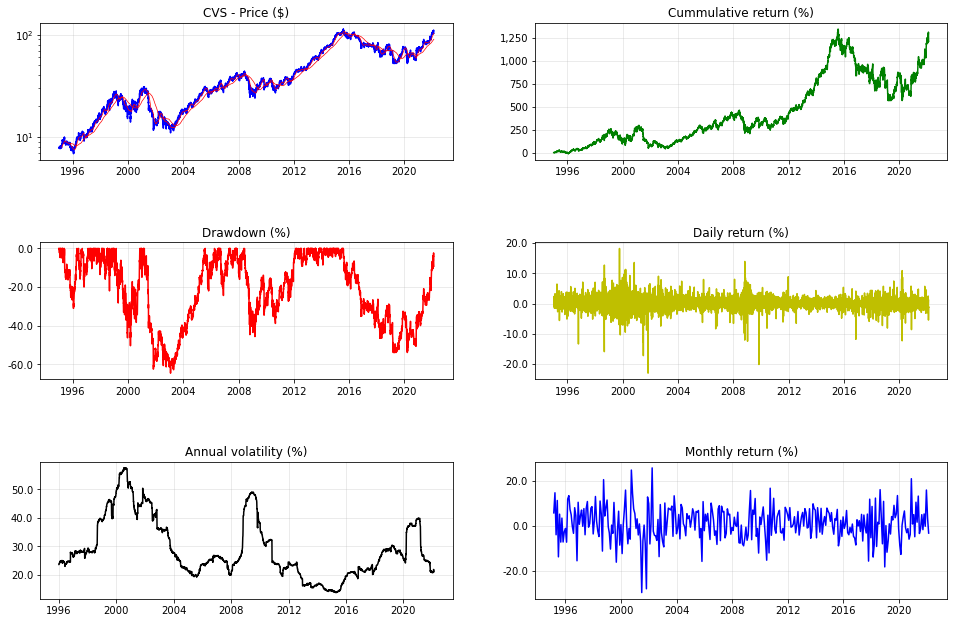

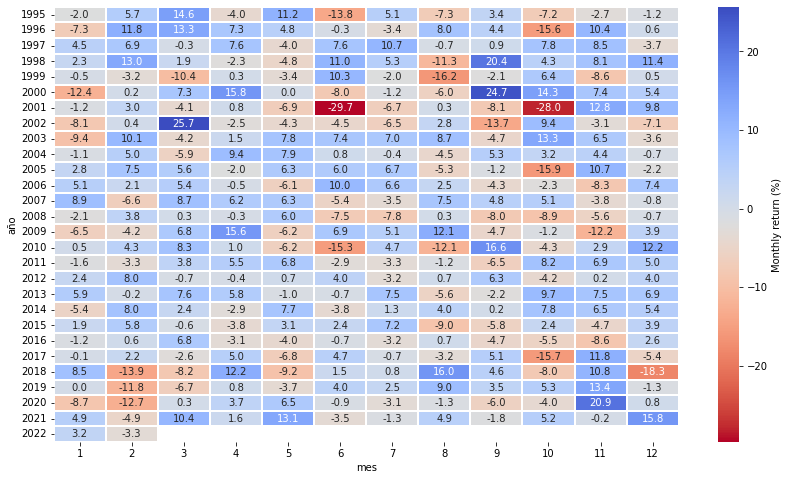

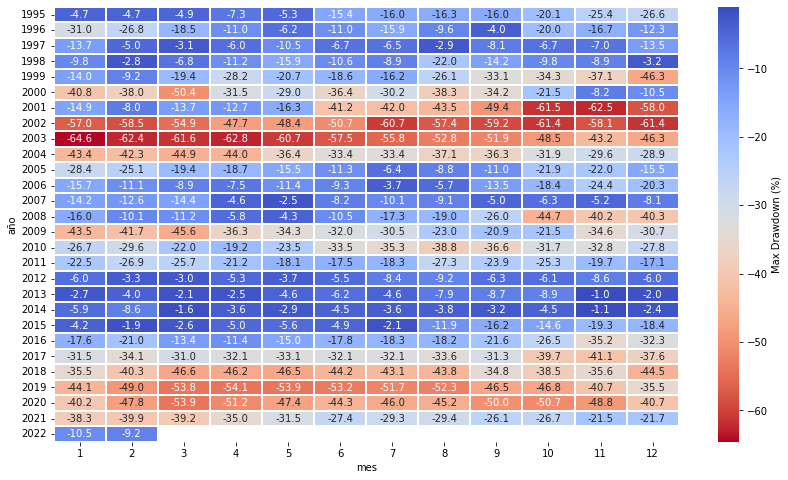

In [5]:
# PLOT PANEL GENERAL

fig,ax =plt.subplots(figsize=(14,8),nrows=3,ncols=2)
fig.subplots_adjust(hspace=0.6,left=0.05, right=0.95, bottom=0.05, top=1.05)

ax[0][0].title.set_text(ticker + ' - Price ($)')
ax[0][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax[0][0].set_yscale('log')
ax[0][0].grid('True',alpha=0.3)
ax[0][0].plot(stock.price,'b-')
ax[0][0].plot(stock.price.rolling(50).mean(),'r-',lw=0.7)
ax[0][0].plot(stock.price.rolling(200).mean(),'r-',lw=0.7)

ax[0][1].title.set_text('Cummulative return (%)')
ax[0][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax[0][1].grid('True',alpha=0.3)
ax[0][1].plot(stock.cagr*100,'g-')

ax[1][0].title.set_text('Drawdown (%)')
ax[1][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[1][0].grid('True',alpha=0.3)
ax[1][0].plot(stock.drawdown*100,'r-')

ax[1][1].title.set_text('Daily return (%)')
ax[1][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[1][1].grid('True',alpha=0.3)
ax[1][1].plot(stock.retorno*100,'y-')

ax[2][0].title.set_text('Annual volatility (%)')
ax[2][0].grid('True',alpha=0.3)
ax[2][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[2][0].plot(stock.volatilidad*100,'k-')
#ax[2][0].axhline(stock.volatilidad.mean(),ls='--',color='r')

ax[2][1].title.set_text('Monthly return (%)')
ax[2][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[2][1].grid('True',alpha=0.3)
ax[2][1].plot(stock.price.resample('M').ffill().pct_change()*100,'b-')

f,ax=plt.subplots(figsize=(14,8))
sns.heatmap(rendimientos,annot=True,fmt='.1f',linewidths=.1,cmap='coolwarm_r',ax=ax,cbar_kws={'label': 'Monthly return (%)'}) #coolwarm/rocket/mako/icefire

f,ax=plt.subplots(figsize=(14,8))
sns.heatmap(rendi,annot=True,fmt='.1f',linewidths=.1,cmap='coolwarm_r',ax=ax,cbar_kws={'label': 'Max Drawdown (%)'}) #coolwarm/rocket/mako/icefire

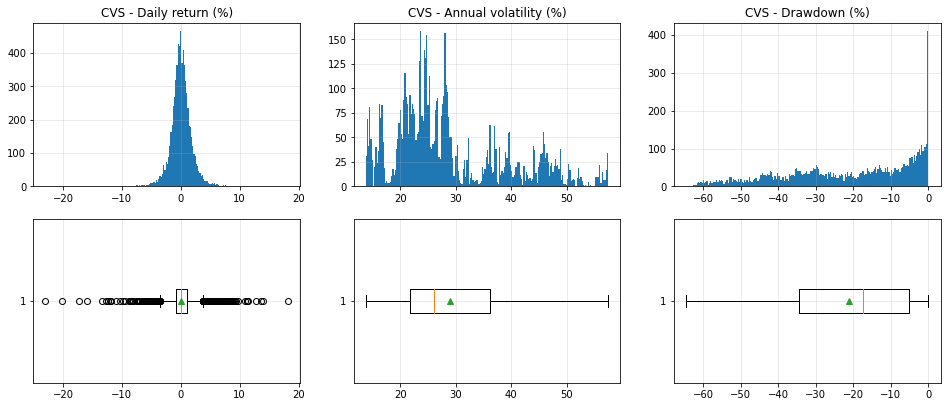

In [6]:
# PLOT PANEL PARTICULAR

fig,ax =plt.subplots(figsize=(14,5),nrows=2,ncols=3)
fig.subplots_adjust(hspace=0.2,left=0.05, right=0.95, bottom=0.05, top=1.05)

ax[0][0].title.set_text(ticker + ' - Daily return (%)')
ax[0][0].hist(stock.retorno.dropna()*100,bins=200)
ax[1][0].boxplot(stock.retorno.dropna()*100,vert=False,showmeans=True,showfliers=True)
ax[0][0].grid('True',alpha=0.3)
ax[1][0].grid('True',alpha=0.3)

ax[0][1].title.set_text(ticker + ' - Annual volatility (%)')
ax[0][1].hist(stock.volatilidad.dropna()*100,bins=200)
ax[1][1].boxplot(stock.volatilidad.dropna()*100,vert=False,showmeans=True,showfliers=True)
ax[0][1].grid('True',alpha=0.3)
ax[1][1].grid('True',alpha=0.3)

ax[0][2].title.set_text(ticker + ' - Drawdown (%)')
ax[0][2].hist(stock.drawdown.dropna()*100,bins=200)
ax[1][2].boxplot(stock.drawdown.dropna()*100,vert=False,showmeans=True,showfliers=True)
ax[0][2].grid('True',alpha=0.3)
ax[1][2].grid('True',alpha=0.3)

In [8]:
print(ticker + ' - Statistics\n')
lista=[stock.retorno.dropna()*100,stock.volatilidad.dropna()*100,stock.drawdown.dropna()*100]
tabla=pd.DataFrame(index=['Size','Min','Max','Mean','Std','Skew','Kurtosis'])
j=0
for i in list(['Daily return (%)','Annual volatility','Drawdown (%)']):
    data=lista[j]
    tabla[i]=[stats.describe(lista[j])[0],stats.describe(lista[j])[1][0],stats.describe(lista[j])[1][1],stats.describe(lista[j])[2],
    np.sqrt(stats.describe(lista[j])[3]),stats.describe(lista[j])[4],stats.describe(lista[j])[5]]
    j+=1

tabla.style.format('{:20,.3f}')

CVS - Statistics



,Daily return (%),Annual volatility,Drawdown (%)
Size,"6,828.000","6,579.000","6,828.000"
Min,-22.992,13.781,-64.589
Max,18.212,57.429,0.000
Mean,0.056,29.001,-21.218
Std,1.929,10.332,17.268
Skew,-0.393,0.851,-0.504
Kurtosis,12.483,-0.119,-0.891


****
## DIMENSION DE DEPENDENCIA

### Variables macro

https://fred.stlouisfed.org/

* VIX (CBOE Volatility Index: VIX (VIXCLS))
* US Treasury 10y (10-Year Treasury Constant Maturity Rate (DGS10))
* US Treasury 2y (2-Year Treasury Constant Maturity Rate (DGS2))
* US Treasury 10y-2y (10-Year Treasury Constant Maturity Minus 2-Year Treasury Constant Maturity (T10Y2Y))

* SPY (SP500)
* NASDAQ (NASDAQ Composite Index (NASDAQCOM))
* DOW JONES (Dow Jones Industrial Average (DJIA))


https://fiscaldata.treasury.gov/datasets/


In [11]:
def recupera():
    
    path='C:\\Users\\Usuario\\Dataset\\MVP_CF3'
    os.chdir(path)
    
    vix=pd.read_excel('VIXCLS.xls',index_col='observation_date')
    us10y=pd.read_excel('DGS10.xls',index_col='observation_date')
    us2y=pd.read_excel('DGS2.xls',index_col='observation_date')
    us10y_2y=pd.read_excel('T10Y2Y.xls',index_col='observation_date')
    spy=pd.read_excel('SP500.xls',index_col='observation_date')
    nasdaq=pd.read_excel('NASDAQCOM.xls',index_col='observation_date')
    djia=pd.read_excel('DJIA.xls',index_col='observation_date')

    macro=pd.concat([vix['VIXCLS'],us10y['DGS10'],us2y['DGS2'],us10y_2y['T10Y2Y'],spy['SP500'],nasdaq['NASDAQCOM'],djia['DJIA']],axis=1)
    macro.columns=['VIX','US10y','US2y','US10y2y','SPY','NASDAQ','DJIA']
    
    with open('macro.pickle','wb') as file:
        pickle.dump(macro,file)
    return

In [16]:
path='C:\\Users\\Usuario\\Dataset\\MVP_CF3'
os.chdir(path)
with open('macro.pickle','rb') as file:
    macro=pickle.load(file)

macro=macro.dropna()
vix=macro.VIX
us10y=macro.US10y
us2y=macro.US2y
spy=macro.SPY
nasdaq=macro.NASDAQ
djia=macro.DJIA
us10y2y=macro.US10y2y

In [17]:
# Definir los quantiles del VIX

#vix.hist(bins=100)
vix.quantile(0.33)
vix.quantile(0.66)
from statistics import *
quantiles(vix,n=3,method='inclusive')

#pd.plotting.boxplot_frame_groupby(macro.groupby('vix_rango'),figsize=(15,5),layout=(1,4))
#plt.show()

[13.943333333333333, 19.66]

In [20]:
macro['vix_rango']=pd.cut(macro.VIX,[0,14,20,np.inf],labels=['baja','media','alta'])

df_total=pd.concat([stock,macro],axis=1)
df_retorno=pd.concat([stock.retorno*100,macro.vix_rango],axis=1)
df_volatilidad=pd.concat([stock.volatilidad*100,macro.vix_rango],axis=1)
df_drawdown=pd.concat([stock.drawdown*100,macro.vix_rango],axis=1)

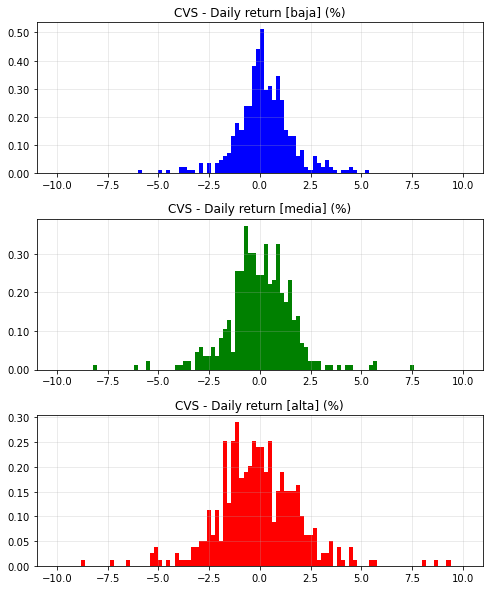

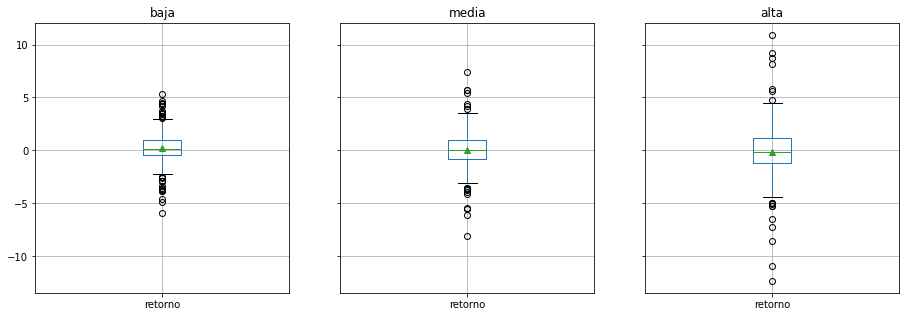

In [21]:
# PLOT 

fig, axs = plt.subplots(3, figsize=(8,10))
extremos=(-10,10)

axs[0].title.set_text(ticker + ' - Daily return [baja] (%)')
axs[0].hist(df_retorno.loc[df_retorno.vix_rango == 'baja'].retorno,bins=100,range=extremos,density=True,color='b')
axs[0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.2f' % x))
axs[0].grid('True',alpha=0.3)

axs[1].title.set_text(ticker + ' - Daily return [media] (%)')
axs[1].hist(df_retorno.loc[df_retorno.vix_rango == 'media'].retorno,bins=100,range=extremos,density=True,color='g')
axs[1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.2f' % x))
axs[1].grid('True',alpha=0.3)

axs[2].title.set_text(ticker + ' - Daily return [alta] (%)')
axs[2].hist(df_retorno.loc[df_retorno.vix_rango == 'alta'].retorno,bins=100,range=extremos,density=True,color='r')
axs[2].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.2f' % x))
axs[2].grid('True',alpha=0.3)

fig.subplots_adjust(hspace=0.3)

pd.plotting.boxplot_frame_groupby(df_retorno.groupby('vix_rango'),figsize=(15,5),layout=(1,3),showmeans=True)
plt.show()

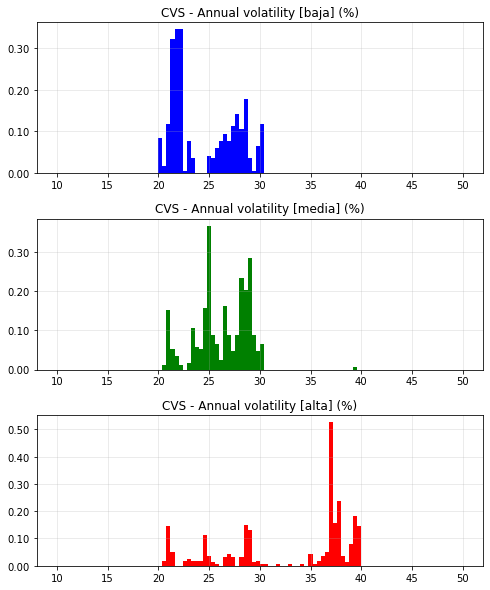

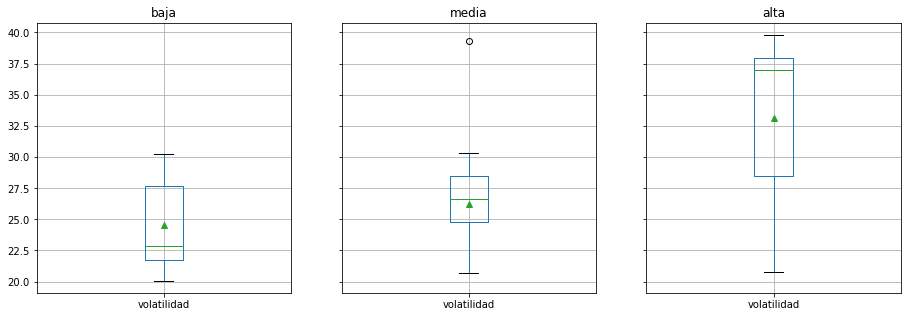

In [22]:
# PLOT 

fig, axs = plt.subplots(3, figsize=(8,10))
extremos=(10,50)

axs[0].title.set_text(ticker + ' - Annual volatility [baja] (%)')
axs[0].hist(df_volatilidad.loc[df_volatilidad.vix_rango == 'baja'].volatilidad,bins=100,range=extremos,density=True,color='b')
axs[0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.2f' % x))
axs[0].grid('True',alpha=0.3)

axs[1].title.set_text(ticker + ' - Annual volatility [media] (%)')
axs[1].hist(df_volatilidad.loc[df_volatilidad.vix_rango == 'media'].volatilidad,bins=100,range=extremos,density=True,color='g')
axs[1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.2f' % x))
axs[1].grid('True',alpha=0.3)

axs[2].title.set_text(ticker + ' - Annual volatility [alta] (%)')
axs[2].hist(df_volatilidad.loc[df_volatilidad.vix_rango == 'alta'].volatilidad,bins=100,range=extremos,density=True,color='r')
axs[2].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.2f' % x))
axs[2].grid('True',alpha=0.3)

fig.subplots_adjust(hspace=0.3)

pd.plotting.boxplot_frame_groupby(df_volatilidad.groupby('vix_rango'),figsize=(15,5),layout=(1,3),showmeans=True)
plt.show()

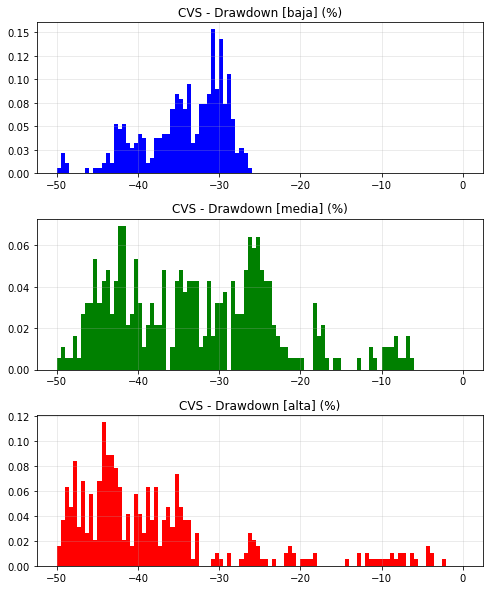

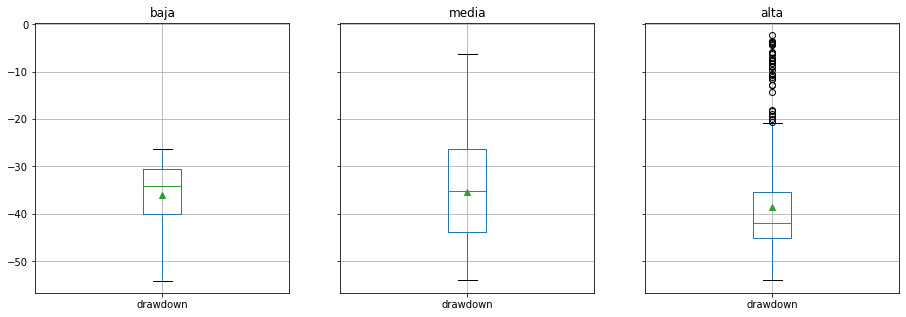

In [23]:
# PLOT 

fig, axs = plt.subplots(3, figsize=(8,10))
extremos=(-50,0)

axs[0].title.set_text(ticker + ' - Drawdown [baja] (%)')
axs[0].hist(df_drawdown.loc[df_drawdown.vix_rango == 'baja'].drawdown,bins=100,range=extremos,density=True,color='b')
axs[0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.2f' % x))
axs[0].grid('True',alpha=0.3)

axs[1].title.set_text(ticker + ' - Drawdown [media] (%)')
axs[1].hist(df_drawdown.loc[df_drawdown.vix_rango == 'media'].drawdown,bins=100,range=extremos,density=True,color='g')
axs[1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.2f' % x))
axs[1].grid('True',alpha=0.3)

axs[2].title.set_text(ticker + ' - Drawdown [alta] (%)')
axs[2].hist(df_drawdown.loc[df_drawdown.vix_rango == 'alta'].drawdown,bins=100,range=extremos,density=True,color='r')
axs[2].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.2f' % x))
axs[2].grid('True',alpha=0.3)

fig.subplots_adjust(hspace=0.3)
pd.plotting.boxplot_frame_groupby(df_drawdown.groupby('vix_rango'),figsize=(15,5),layout=(1,3),showmeans=True)
plt.show()

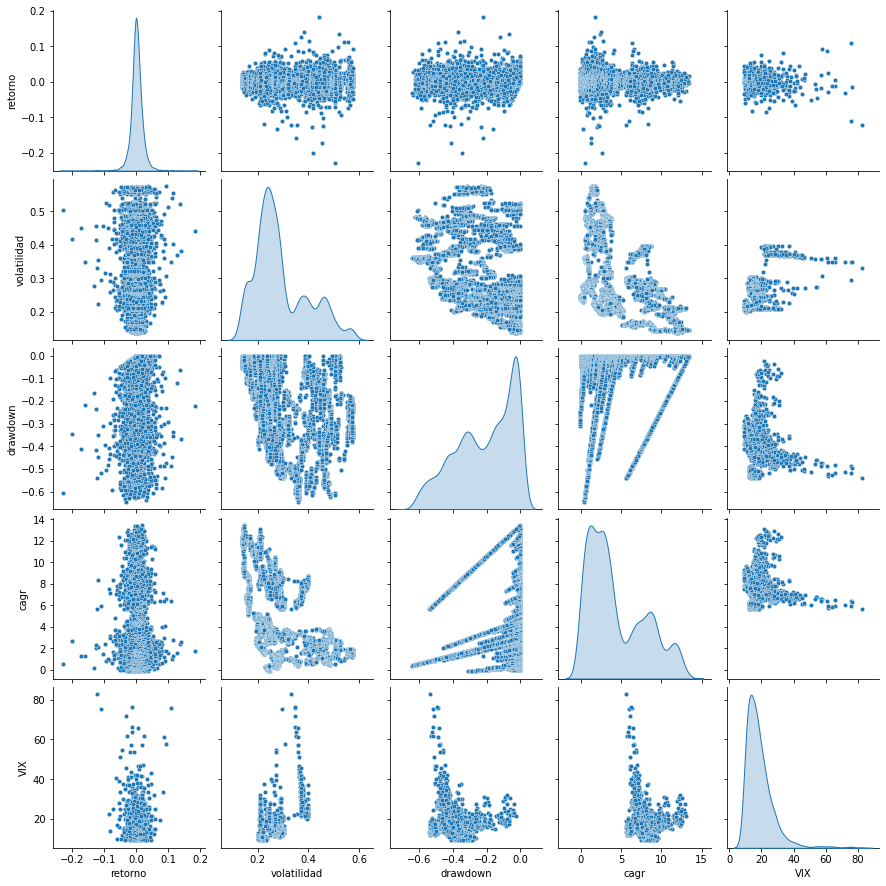

In [24]:
sns.pairplot(df_total,vars=['retorno','volatilidad','drawdown','cagr','VIX'],diag_kind='kde',plot_kws={'s':20})

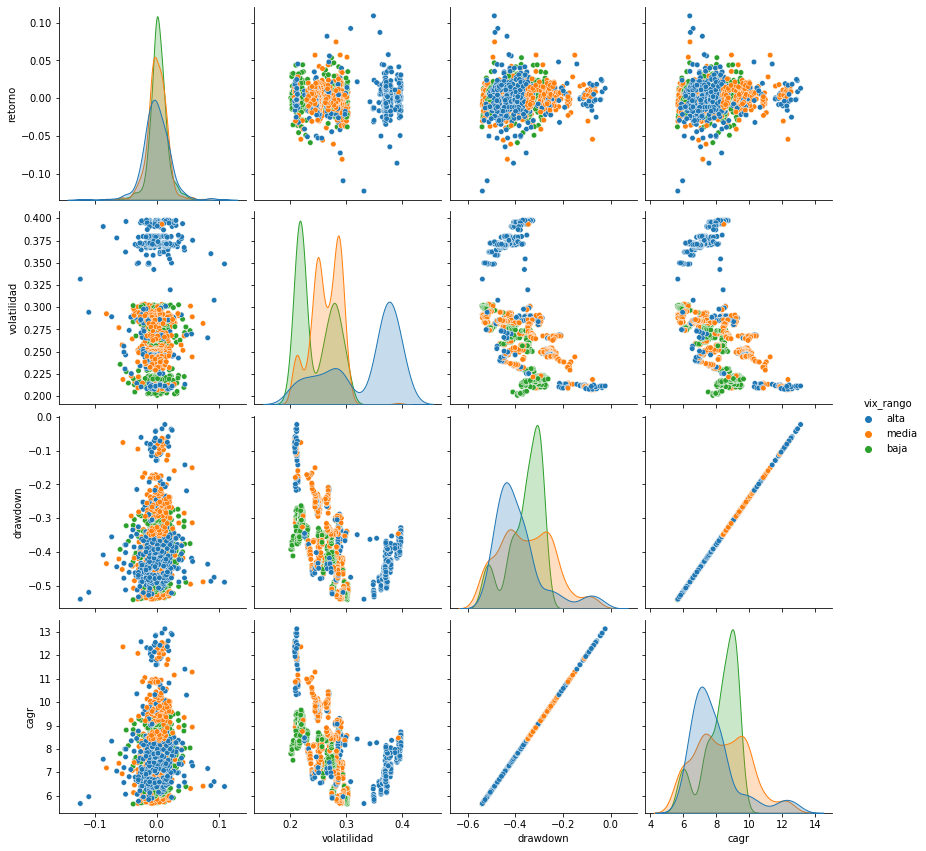

In [25]:
sns.pairplot(df_total,vars=['retorno','volatilidad','drawdown','cagr'],diag_kind='kde',hue='vix_rango',hue_order = ['alta','media','baja'],height=3,plot_kws={'s':30})

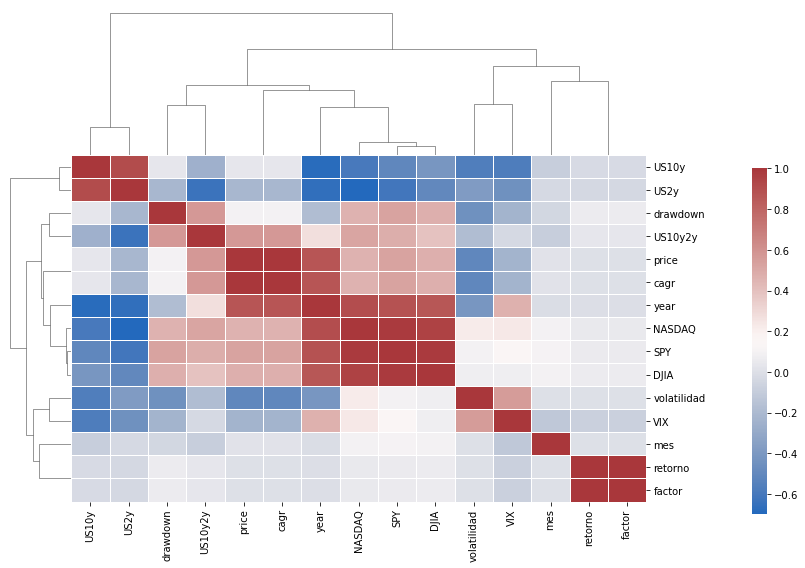

In [26]:
sns.clustermap(df_total.corr(),cmap='vlag',dendrogram_ratio=(.1,.3),cbar_pos=(1.05,.1,.02,.6),linewidths=1,figsize=(10,8))

Text(0.5, 1.0, 'Features Correlating')

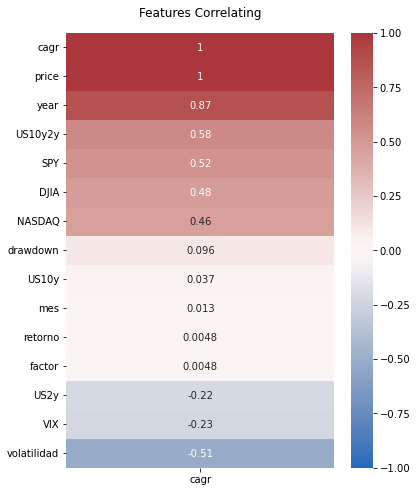

In [27]:
plt.figure(figsize=(6, 8))
heatmap = sns.heatmap(df_total.corr()[['cagr']].sort_values(by='cagr', ascending=False), vmin=-1, vmax=1, annot=True, cmap='vlag')
heatmap.set_title('Features Correlating', fontdict={'fontsize':12}, pad=16)

In [363]:
#sns.lmplot(data=df_total,y='cagr',x='US10y',hue='year',markers='.',height=7)

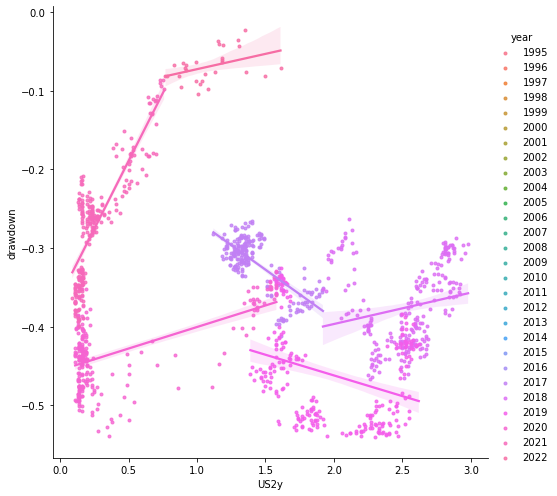

In [28]:
sns.lmplot(data=df_total,y='drawdown',x='US2y',hue='year',markers='.',height=7)

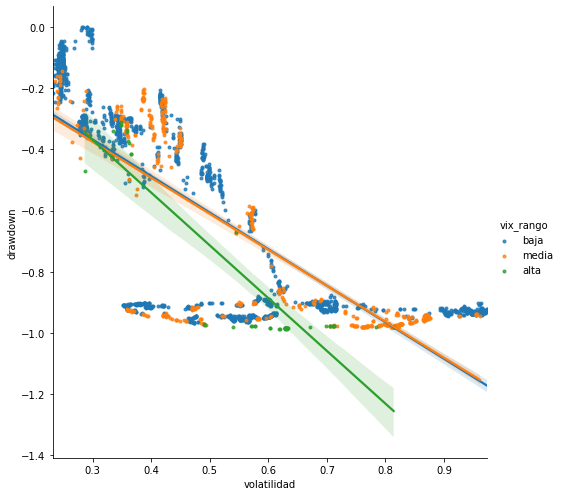

In [28]:
sns.lmplot(data=df_total,x='volatilidad',y='drawdown',hue='vix_rango',markers='.',height=7)

In [19]:
df_total['drawdown'].corr(df_total['US10y2y']).mean()

-0.16767356819026158

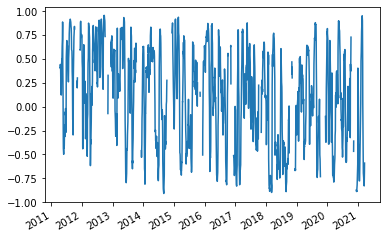

In [20]:
df_total['drawdown'].rolling(20).corr(df_total['US10y2y']).plot()

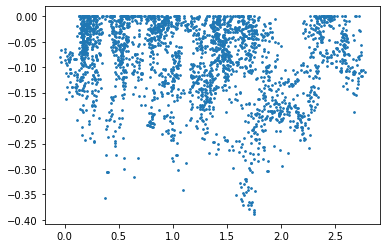

In [21]:
plt.scatter(df_total['US10y2y'],df_total['drawdown'],s=3)

### Clusterizacion

In [19]:
from sklearn.cluster import KMeans
from sklearn.cluster import MeanShift
from sklearn.cluster import DBSCAN
from sklearn.mixture import GaussianMixture

from sklearn.metrics import silhouette_score

from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

In [20]:
def define_y(a=1):
    """
    Valores: 1(retorno) 2(volatilidad) 3(drawdown) 4(cagr)
    """
    if a==1:
        data_y=df_total['retorno']
        label_y='retorno'
    elif a==2:
        data_y=df_total['volatilidad']
        label_y='volatilidad'
    elif a==3:
        data_y=df_total['drawdown']
        label_y='drawdown'
    elif a==4:
        data_y=df_total['cagr']
        label_y='cagr'
    else:
        print('defina variable y')
        data_y=np.nan
        label_y=' '
    
    return data_y,label_y

In [21]:
def define_x(a=1):
    """
    Valores: 1(VIX) 2(US2y) 3(US10y) 4(US10y2y)
    """
    if a==1:
        data_x=df_total['VIX']
        label_x='VIX'
    elif a==2:
        data_x=df_total['US2y']
        label_x='US2y'
    elif a==3:
        data_x=df_total['US10y']
        label_x='US10y'
    elif a==4:
        data_x=df_total['US10y2y']
        label_x='US10y2y'
    else:
        print('defina variable x')
        data_x=np.nan
        label_x=' '
    
    return data_x,label_x

In [23]:
# Define variables de interes

df_total=pd.concat([stock,macro],axis=1)
data_y, label_y=define_y(3)
data_x, label_x=define_x(3)

In [24]:
arr = pd.concat([data_x,data_y],axis=1).dropna().to_numpy()
arr_esc = StandardScaler().fit_transform(arr)

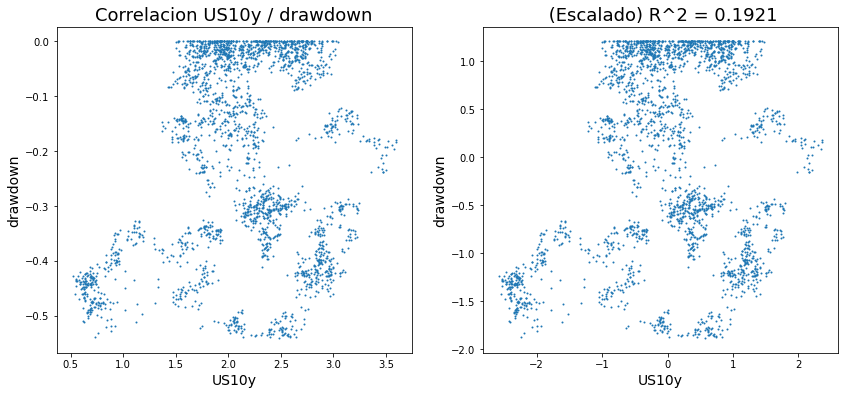

In [25]:
fig, ax = plt.subplots(figsize=(14,6), ncols=2)
r2 = data_x.corr(data_y).round(4)

titulo = 'Correlacion ' + data_x.name + ' / ' + data_y.name
ax[0].scatter(arr[:,0],arr[:,1], s=1) #scatter(x,y, s=1)
ax[0].set_title(titulo, fontsize=18)
ax[0].set_xlabel(data_x.name, fontsize=14)
ax[0].set_ylabel(data_y.name, fontsize=14)

titulo  = ' (Escalado) R^2 = ' + str(r2)
ax[1].scatter(arr_esc[:,0],arr_esc[:,1], s=1)
ax[1].set_title(titulo, fontsize=18)
ax[1].set_xlabel(data_x.name, fontsize=14)
ax[1].set_ylabel(data_y.name, fontsize=14)

plt.show()

### Hierarchy 

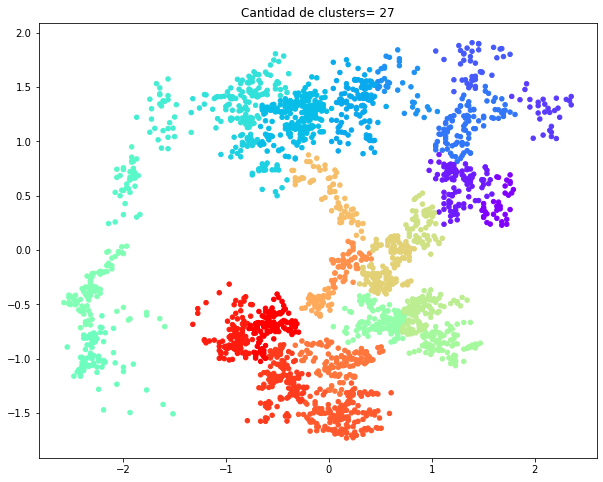

In [348]:
agrupados = linkage(arr_esc, 'ward', metric='euclidean') # single - complete - average - centroid - ward 
clusters = fcluster(agrupados, t=3, criterion='distance')
fig, ax = plt.subplots(figsize=(10,8), nrows=1)
ax.scatter(arr_esc[:,0],arr_esc[:,1], s=20, c=clusters,cmap='rainbow')
ax.set_title('Cantidad de clusters= '+ np.array2string(clusters.max()), fontsize=12)
plt.show()

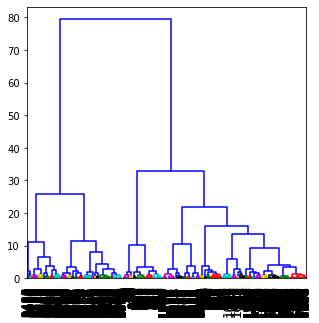

In [198]:
labelList = range(len(arr_esc))
plt.figure(figsize=(5,5))  
dendrogram(agrupados, labels=labelList, leaf_font_size=12, color_threshold=1.5)
plt.show()  

In [492]:
# Check financial modeling x P/E promedio x sector
# Check financial modeling x Peers recomendation

def screenStock(minMktCap= 10**10,minBeta=1,minVol=10000,minDiv=0):
    
    url='https://financialmodelingprep.com/api/v3/stock-screener/'
    
    api_key='bb2325e9fc32528d8472b3d75d1bd41c'
    p = {'apikey': api_key, 'marketCapMoreThan':minMktCap ,'betaMoreThan':minBeta, 'volumeMoreThan':minVol, 'dividendMoreThan':minDiv}
    r = requests.get(url, params = p)
    js = r.json()
    df = pd.DataFrame(js)
    return df

In [493]:
data = screenStock().drop('companyName', axis=1)
data.groupby('exchangeShortName').size()

exchangeShortName
AMEX          3
EURONEXT     38
NASDAQ      150
NYSE        293
TSX          22
dtype: int64

In [494]:
#data['div_yield'] = data['lastAnnualDividend'] / data['price'] # Proxy del dividend yield
data['vol_mln'] = data['price'] * data['volume'] / 1000000

df = data.loc[(data.exchangeShortName=='NASDAQ') |  (data.exchangeShortName=='NYSE')].copy().reset_index()
#df = df.loc[:75,['symbol','marketCap','beta','div_yield','vol_mln']]
df = df.loc[:75,['symbol','marketCap','beta','vol_mln']]

#valores = df.iloc[:,[1,2,3,4]].values
valores = df.iloc[:,[1,2,3]].values
valores_esc = StandardScaler().fit_transform(valores)

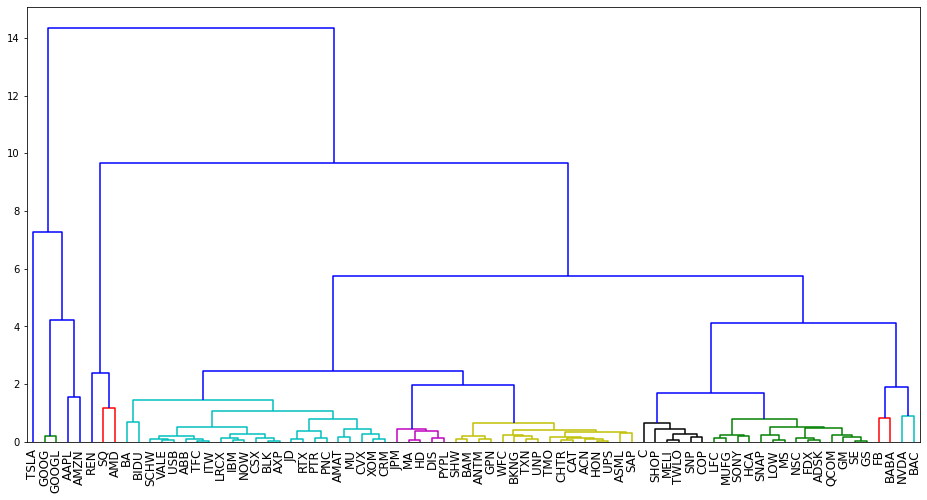

In [495]:
clusterizado = linkage(valores_esc, method = 'ward')
labels = df.iloc[:,0].values

fig, ax = plt.subplots(figsize=(16, 8))  
dendrogram(clusterizado, labels=labels, color_threshold=1.5, leaf_font_size=12, ax=ax)
#ax.set_ylim(0,8)
plt.show() 

,symbol,marketCap,beta,vol_mln,cluster
0,AAPL,2218852880000,1.337580,14058.974628,2
1,AMZN,1677832490000,1.287330,11820.465162,3
2,GOOG,1539839230000,1.022765,3539.289063,1
3,GOOGL,1537862660000,1.071710,4061.646256,1
4,FB,857407030000,1.272310,5994.816763,12
...,...,...,...,...,...
71,HCA,65160245000,1.563730,304.770070,11
72,GPN,62694822000,1.023880,364.773211,9
73,ADSK,62555173000,1.444700,407.882279,11
74,TWLO,62062514000,1.625740,829.991406,10


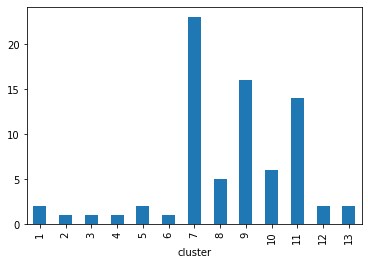

In [496]:
clusters = fcluster(clusterizado, t=1.5, criterion='distance')
df['cluster']  = clusters
df.groupby('cluster').size().plot(kind='bar')
df

In [497]:
df_esc = pd.DataFrame(valores_esc)
df_esc.columns=df.columns[1:-1]
df_esc['cluster'] = clusters
df_esc['simbolo'] = labels

cantidades = df_esc.groupby('cluster').size()
clusteres_grandes = list(cantidades.sort_values(ascending=False).index)[:6]
clusteres_grandes

[7, 9, 11, 10, 8, 13]

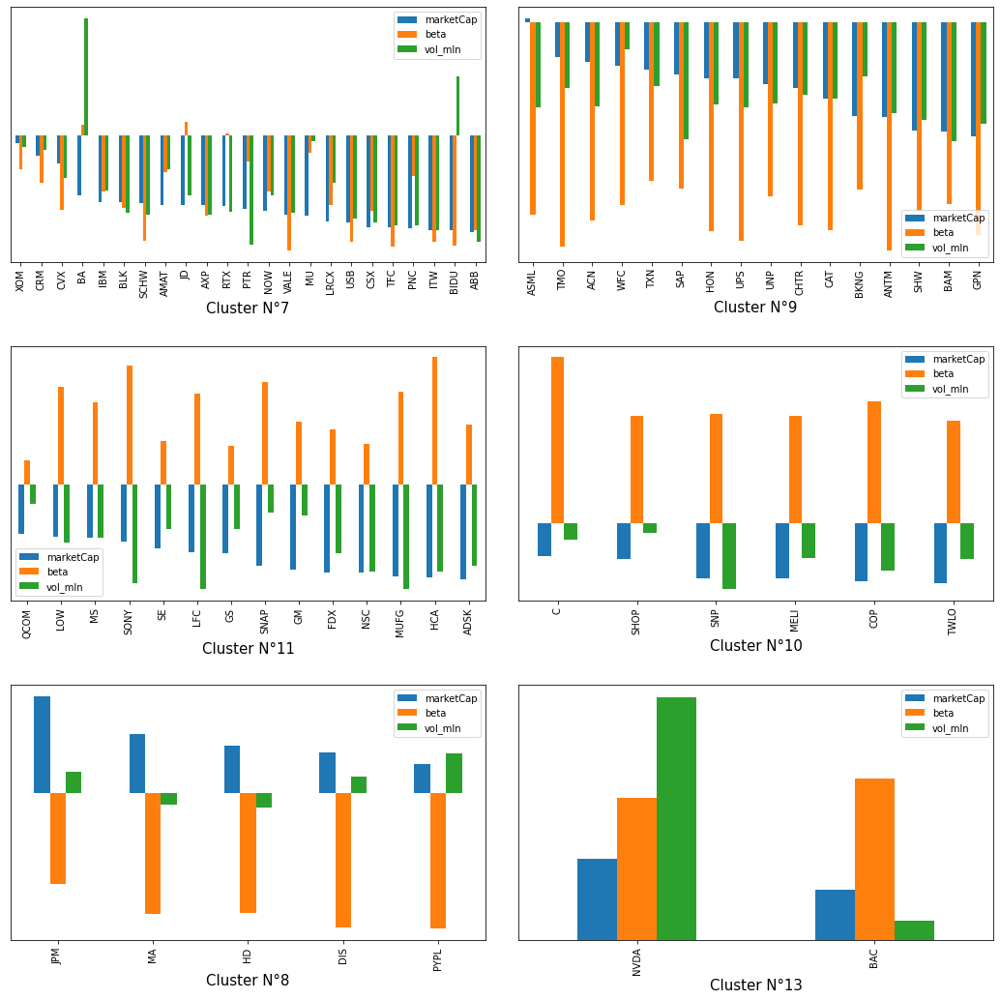

In [498]:
columnas = 2
fig, ax = plt.subplots(figsize=(15,15), ncols=columnas, nrows=3)

for i in range(len(clusteres_grandes)):
    col = i % columnas
    row = i // columnas    
    cluster = clusteres_grandes[i]
    grupo = df_esc.loc[df_esc.cluster==cluster].drop(['cluster'], axis=1).set_index('simbolo')
    grupo.plot(kind='bar', ax=ax[row][col])
    ax[row][col].axes.yaxis.set_visible(False)
    ax[row][col].set_xlabel('Cluster N°'+str(cluster), fontsize=15)

fig.tight_layout(pad=3.0)
plt.show()

In [500]:
cant = df.groupby('cluster').size()
medias = df.groupby('cluster').mean()
medias['cantidades'] = cant
medias = medias.sort_values('cantidades', ascending=False)
medias

,marketCap,beta,vol_mln,cantidades
cluster,,,,
7,1.138071e+11,1.233097,950.118289,23
9,1.408519e+11,1.050293,648.827331,16
11,1.023457e+11,1.469178,688.128423,14
10,9.367245e+10,1.672223,849.566849,6
8,3.620698e+11,1.103824,1993.115470,5
1,1.538851e+12,1.047238,3800.467659,2
5,1.036525e+11,2.473565,3075.688989,2
12,7.451482e+11,1.284855,4967.821347,2
13,3.501665e+11,1.553325,3614.652254,2


### K Means

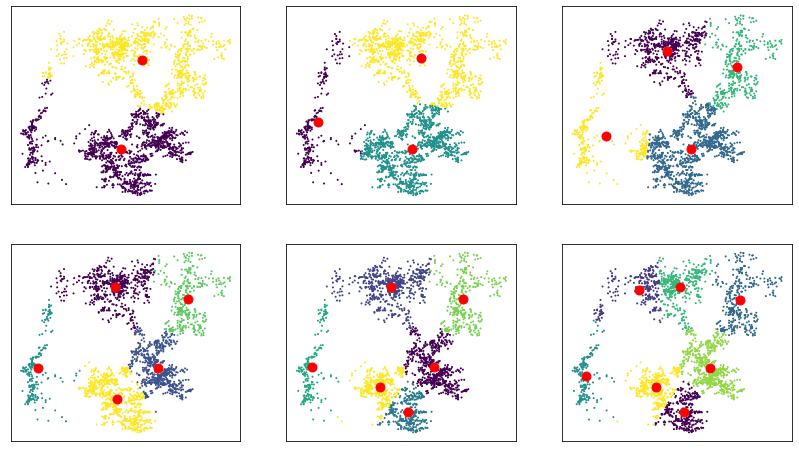

In [349]:
filas = 2
columnas = 3
fig, ax = plt.subplots(figsize=(14,8), nrows=filas, ncols=columnas)

for i in range (filas*columnas):
    col = i % columnas
    row = i // columnas
    modelo = KMeans(n_clusters = i+2)
    y_means = modelo.fit_predict(arr_esc)
    centroides = modelo.cluster_centers_
    ax[row][col].scatter(arr_esc[:,0], arr_esc[:,1], s=1, c=y_means)
    ax[row][col].scatter(centroides[:,0], centroides[:,1], s=80, color='r')
    ax[row][col].axes.xaxis.set_visible(False)
    ax[row][col].axes.yaxis.set_visible(False)
    #ax[row][col].text(s = 'n='+str(i+2), fontsize=20, y=0, x=6)

plt.show()

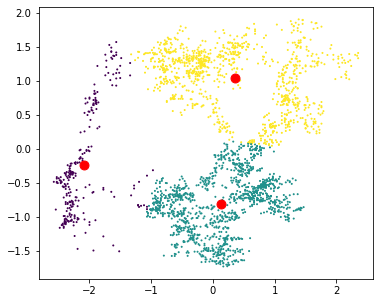

In [350]:
n = 5
modelo = KMeans(n_clusters = n).fit(arr_esc)
y_means = modelo.fit_predict(arr_esc)
centroides = modelo.cluster_centers_

fig, ax = plt.subplots(figsize=(6,5), nrows=1)
ax.scatter(arr_esc[:,0], arr_esc[:,1], s=1, c=y_means)
ax.scatter(centroides[:,0], centroides[:,1], s=80, color='r')

### Gaussian Mixture

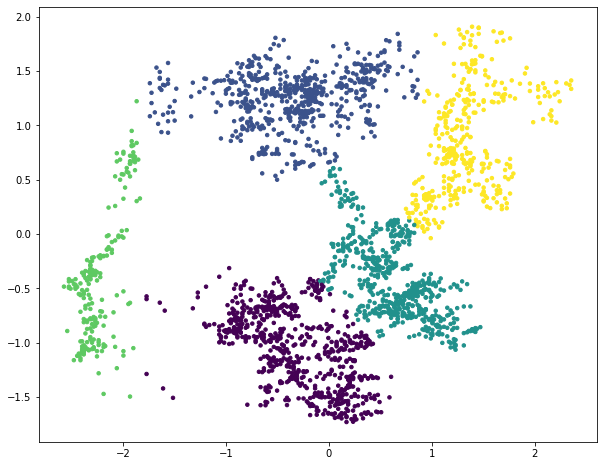

In [353]:
n=5
modelo = GaussianMixture(n_components=n, covariance_type='full').fit(arr_esc)
y_means = modelo.predict(arr_esc)

fig, ax = plt.subplots(figsize=(10,8), nrows=1)
ax.scatter(arr_esc[:,0], arr_esc[:,1], s=12, c=y_means)

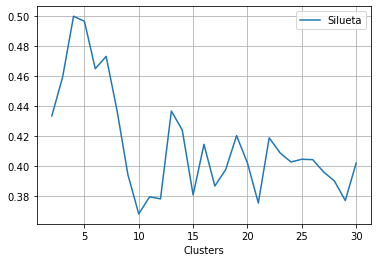

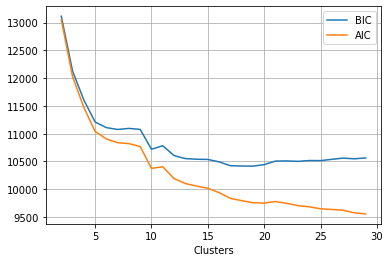

In [352]:
fig, ax = plt.subplots(figsize=(6,4), nrows=1)

pruebas = 30
modelos = [GaussianMixture(n_components=n, covariance_type='full').fit(arr_esc)  for n in range(2,pruebas+1)]

labels = [m.predict(arr_esc) for m in modelos]
siluetas = [silhouette_score(arr_esc, m.predict(arr_esc)) for m in modelos]
ax.plot(range(2,pruebas+1), siluetas, label='Silueta')
ax.legend()
ax.set_xlabel('Clusters')
ax.grid()
plt.show()

fig, ax = plt.subplots(figsize=(6,4))

pruebas = np.arange(2, 30)
modelos = [GaussianMixture(n, covariance_type='full', random_state=0).fit(arr_esc) for n in pruebas]
ax.plot(pruebas, [m.bic(arr_esc) for m in modelos], label='BIC')
ax.plot(pruebas, [m.aic(arr_esc) for m in modelos], label='AIC')
ax.legend(loc='best')
ax.set_xlabel('Clusters')
ax.grid()
plt.show()

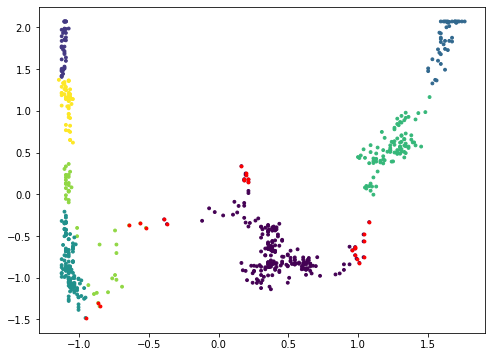

In [171]:
densities = modelo.score_samples(arr_esc)
density_threshold = np.percentile(densities, 4) # 4% de las instancias se catalogan como outliers
anomalies = arr_esc[densities < density_threshold]
fig, ax = plt.subplots(figsize=(8,6), nrows=1)
ax.scatter(arr_esc[:,0], arr_esc[:,1], s=8, c=y_means)
ax.scatter(anomalies[:,0], anomalies[:,1], s=8,color='r')

In [248]:
# Calcula el numero de clusters optimos observando los pesos
from sklearn.mixture import BayesianGaussianMixture
bgm = BayesianGaussianMixture(n_components=30, n_init=10, random_state=42)
bgm.fit(arr_esc)
np.round(bgm.weights_, 2)

array([0.28, 0.16, 0.17, 0.15, 0.07, 0.04, 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.11, 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ,
       0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  , 0.  ])

### DBSCAN

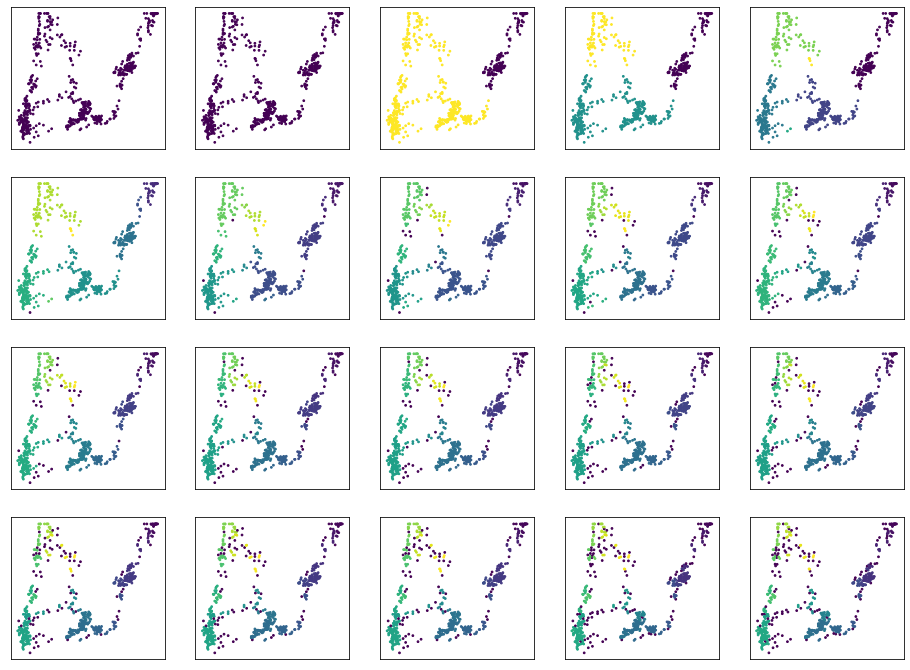

In [253]:
filas = 4
columnas = 5
fig, ax = plt.subplots(figsize=(16,12), nrows=filas, ncols=columnas)

for i in range (filas*columnas):
    col = i % columnas
    row = i // columnas
    
    tolerancia = round(1/(i+1),2)
    modelo = DBSCAN(eps = tolerancia, min_samples=2).fit(arr_esc) 
    y_means = modelo.fit_predict(arr_esc)
    ax[row][col].scatter(arr_esc[:,0], arr_esc[:,1], s=3, c=y_means)
    ax[row][col].axes.xaxis.set_visible(False)
    ax[row][col].axes.yaxis.set_visible(False)
    #ax[row][col].text(s = 'eps='+str(tolerancia), fontsize=8, y=-0.5, x=6)
    

plt.show()

Con epsilon=1.0 hay un solo cluster
Con epsilon=0.5 hay un solo cluster


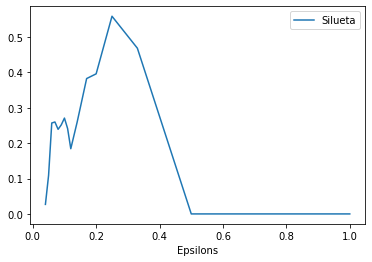

In [254]:
fig, ax = plt.subplots(figsize=(6,4), nrows=1)

pruebas = 25
siluetas = []
epsilons = []
for n in range(pruebas):
    epsilon = round(1/(n+1),2)
    epsilons.append(epsilon)
    try:
        m = DBSCAN(eps = epsilon, min_samples=2).fit(arr_esc)
        siluetas.append(silhouette_score(arr_esc, m.labels_))
    except:
        print(f'Con epsilon={epsilon} hay un solo cluster')
        siluetas.append(0)

    
ax.plot(epsilons, siluetas, label='Silueta')
ax.legend()
ax.set_xlabel('Epsilons')
plt.show()

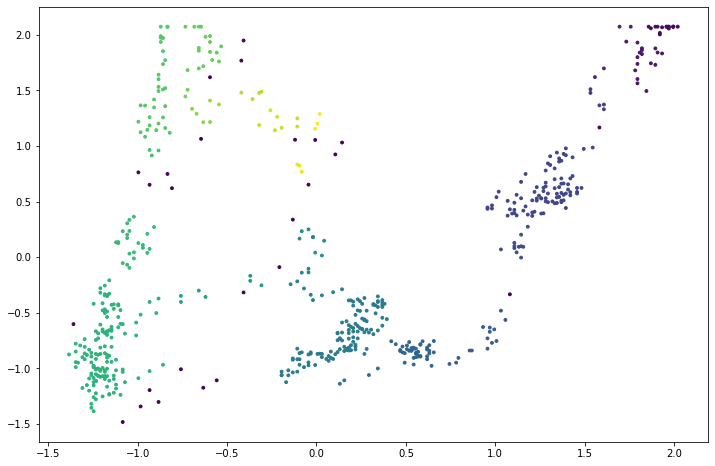

In [255]:
modelo = DBSCAN(eps = 0.1, min_samples=2).fit(arr_esc) 
y_means = modelo.fit_predict(arr_esc)
fig, ax = plt.subplots(figsize=(12,8), nrows=1)
ax.scatter(arr_esc[:,0], arr_esc[:,1], s=8, c=y_means)

### Final de Clustering

In [26]:
# Define variables de interes

df_total=pd.concat([stock,macro],axis=1)
data_y, label_y=define_y(3)
data_x, label_x=define_x(3)
print(label_y,label_x)

drawdown US10y


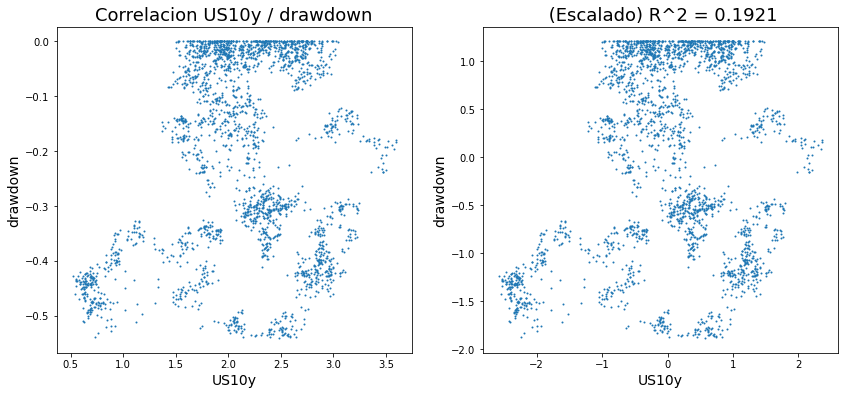

In [27]:
arr = pd.concat([data_x,data_y],axis=1).dropna().to_numpy()
arr_esc = StandardScaler().fit_transform(arr)

fig, ax = plt.subplots(figsize=(14,6), ncols=2)
r2 = data_x.corr(data_y).round(4)

titulo = 'Correlacion ' + data_x.name + ' / ' + data_y.name
ax[0].scatter(arr[:,0],arr[:,1], s=1) #scatter(x,y, s=1)
ax[0].set_title(titulo, fontsize=18)
ax[0].set_xlabel(data_x.name, fontsize=14)
ax[0].set_ylabel(data_y.name, fontsize=14)

titulo  = ' (Escalado) R^2 = ' + str(r2)
ax[1].scatter(arr_esc[:,0],arr_esc[:,1], s=1)
ax[1].set_title(titulo, fontsize=18)
ax[1].set_xlabel(data_x.name, fontsize=14)
ax[1].set_ylabel(data_y.name, fontsize=14)

plt.show()

In [28]:
#r2 = data_x.corr(data_y).round(4)

arr = pd.concat([data_x,data_y],axis=1).dropna()
arr_esc = StandardScaler().fit_transform(arr)

arr=arr.reset_index()
arr.rename(columns={'index':'fecha'},inplace=True)

In [29]:
n=4

modelo = KMeans(n_clusters = n).fit(arr_esc)
y_means = modelo.fit_predict(arr_esc)
centroides = modelo.cluster_centers_ 

clustersList = list(y_means)
for i in range(len(arr)):
    arr.loc[i,'cluster'] = clustersList.pop()

In [30]:
# SOLO lo utilizo para validar plots scaled/no scaled estan bien

#colores= ["orange","green","brown","cyan","magenta","blue","red","yellow","lightgreen","pink"]  
#plt.figure(figsize=(6,4))

#for c in range(n):
        
#    df_total = arr.loc[arr.cluster == c]
#    co = round(df_total[label_x].corr(df_total[label_y]),2)

#    plt.scatter(arr_esc[y_means == c,0],arr_esc[y_means == c,1],s=5, color=colores[c], cmap='rainbow')
#    coords = (centroides[c,0]*0.9, centroides[c,1])
#    t = plt.gca().annotate(f"$ r^2 = {co} $".format('g'), coords, fontsize=16, c="w")
#    t.set_bbox(dict(facecolor='k', alpha=0.6, edgecolor='k'))


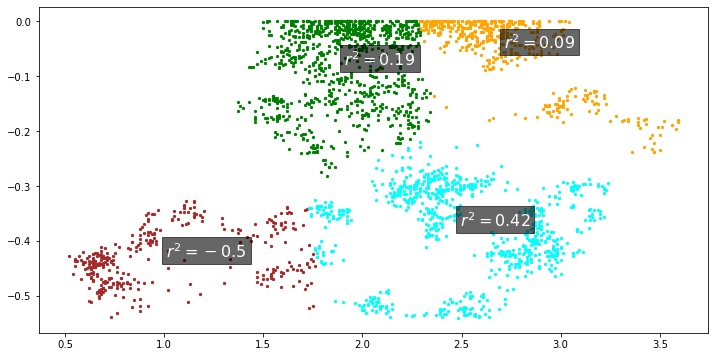

In [31]:
colores= ["orange","green","brown","cyan","magenta","blue","red","yellow","lightgreen","pink"]  
plt.figure(figsize=(12,6))

for c in range(n):
        
    df_total = arr.loc[arr.cluster == c]
    co = round(df_total[label_x].corr(df_total[label_y]),2)

    plt.scatter(arr.loc[y_means == c][label_x],arr.loc[y_means == c][label_y],s=5, color=colores[c], cmap='rainbow')
            
    coords = (arr.loc[y_means==c][label_x].mean(), arr.loc[y_means==c][label_y].mean())
    t = plt.gca().annotate(f"$ r^2 = {co} $".format('g'), coords, fontsize=16, c="w")
    t.set_bbox(dict(facecolor='k', alpha=0.6, edgecolor='k'))


In [32]:
modelo = GaussianMixture(n_components=n, covariance_type='full').fit(arr_esc)
y_means = modelo.predict(arr_esc)

clustersList = list(y_means)
for i in range(len(arr)):
    arr.loc[i,'cluster'] = clustersList.pop()

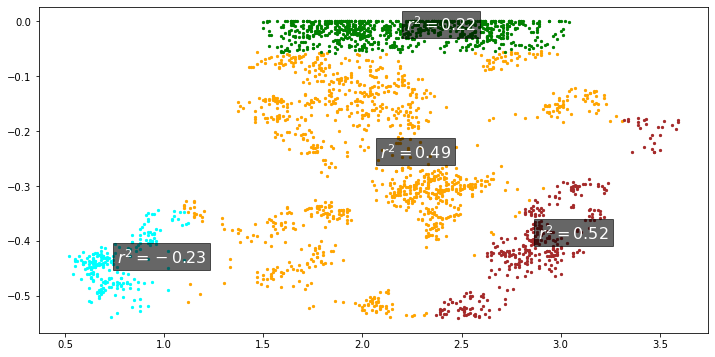

In [33]:
plt.figure(figsize=(12,6))

for c in range(n):
        
    df_total = arr.loc[arr.cluster == c]
    co = round(df_total[label_x].corr(df_total[label_y]),2)

    plt.scatter(arr.loc[y_means == c][label_x],arr.loc[y_means == c][label_y],s=5, color=colores[c], cmap='rainbow')
            
    coords = (arr.loc[y_means==c][label_x].mean(), arr.loc[y_means==c][label_y].mean())
    t = plt.gca().annotate(f"$ r^2 = {co} $".format('g'), coords, fontsize=16, c="w")
    t.set_bbox(dict(facecolor='k', alpha=0.6, edgecolor='k'))


In [34]:
modelo = DBSCAN(eps = 0.2, min_samples=2).fit(arr_esc) 
y_means = modelo.fit_predict(arr_esc)

clustersList = list(y_means)
for i in range(len(arr)):
    arr.loc[i,'cluster'] = clustersList.pop()

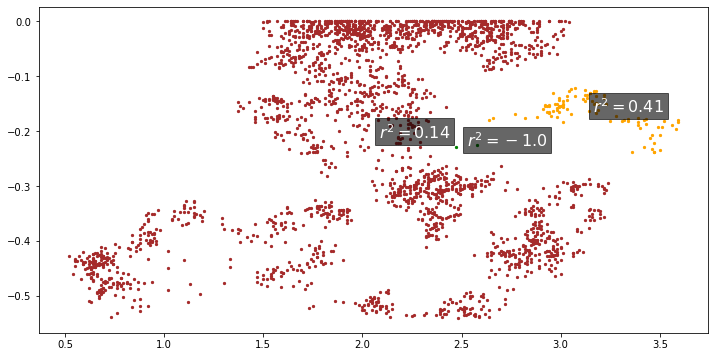

In [35]:
plt.figure(figsize=(12,6))

for c in range(n):
        
    df_total = arr.loc[arr.cluster == c]
    co = round(df_total[label_x].corr(df_total[label_y]),2)

    #plt.scatter(arr_esc[y_means == c,0],arr_esc[y_means == c,1],s=5, color=colores[c], cmap='rainbow')
    plt.scatter(arr.loc[y_means == c][label_x],arr.loc[y_means == c][label_y],s=5, color=colores[c], cmap='rainbow')
            
    coords = (arr.loc[y_means==c][label_x].mean(), arr.loc[y_means==c][label_y].mean())
    t = plt.gca().annotate(f"$ r^2 = {co} $".format('g'), coords, fontsize=16, c="w")
    t.set_bbox(dict(facecolor='k', alpha=0.6, edgecolor='k'))


****
## DIMENSION TECNICA

In [29]:
def getPrice(symbol):
    """
    Historical Daily Prices
    Dado un activo (symbol), retorna unicamente su closing price historico (máx 40 years)
    Return: daily dataframe (close)
    """        
    url='https://financialmodelingprep.com/api/v3/historical-price-full/'+symbol
    
    api_key='bb2325e9fc32528d8472b3d75d1bd41c'
    p= {'serietype' : 'line','apikey': api_key}
    r=requests.get(url,params=p)
    js=r.json()
    df=pd.DataFrame(js['historical'])
    df.set_index('date',inplace=True)
    df.index=pd.to_datetime(df.index)
    df.rename(columns={'close':'price'},inplace=True)
    df.sort_values('date',ascending=True, inplace=True)
    return df

In [30]:
def getPriceVolume(symbol):
    """
    Historical Daily Prices with change and volume
    Dado un activo (symbol), retorna unicamente su closing price historico (máx 10 years)
    Return: daily dataframe (close)
    """        
    url='https://financialmodelingprep.com/api/v3/historical-price-full/'+symbol
    
    api_key='bb2325e9fc32528d8472b3d75d1bd41c'
    p= {'apikey': api_key}
    r=requests.get(url,params=p)
    js=r.json()
    df=pd.DataFrame(js['historical'])
    df.set_index('date',inplace=True)
    df.index=pd.to_datetime(df.index)
    df.rename(columns={'adjClose':'price'},inplace=True)
    df.sort_values('date',ascending=True, inplace=True)
    return df

In [31]:
def getQuote(symbol):
    """
    Company Quote


    """
    url='https://financialmodelingprep.com/api/v3/quote/'+symbol
    
    api_key='bb2325e9fc32528d8472b3d75d1bd41c'
    p = {'apikey': api_key}
    r = requests.get(url, params = p)
    js = r.json()
    df=pd.DataFrame(js)
    return df

In [32]:
historia=getPrice(ticker)
reciente=getPriceVolume(ticker)
quote=getQuote(ticker)

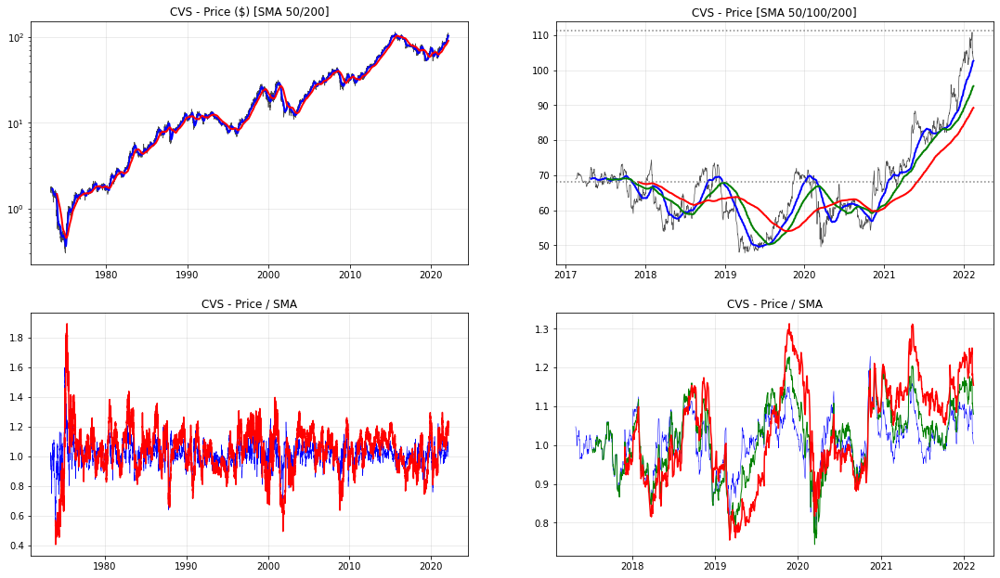

In [33]:
# PLOT PANEL GENERAL

fig,ax =plt.subplots(figsize=(16,8),nrows=2,ncols=2)
fig.subplots_adjust(hspace=0.2,left=0.05, right=0.95, bottom=0.05, top=1.05)

ax[0][0].title.set_text(ticker + ' - Price ($) [SMA 50/200]')
ax[0][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax[0][0].set_yscale('log')
ax[0][0].grid('True',alpha=0.3)
ax[0][0].plot(historia.price,'k-',lw=0.7,alpha=0.7)
ax[0][0].plot(historia.price.rolling(50).mean(),'b-',lw=2)
ax[0][0].plot(historia.price.rolling(200).mean(),'r-',lw=2)

ax[1][0].title.set_text(ticker + ' - Price / SMA')
ax[1][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[1][0].grid('True',alpha=0.3)
ax[1][0].plot(historia.price/historia.price.rolling(50).mean(),'b-',lw=0.5)
ax[1][0].plot(historia.price/historia.price.rolling(200).mean(),'r-',lw=1.5)

ax[0][1].title.set_text(ticker + ' - Price [SMA 50/100/200]')
ax[0][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax[0][1].grid('True',alpha=0.3)
#ax[0][1].plot(reciente.price,'k',ls='',marker='o',ms=4,lw=0.7,alpha=0.7)
ax[0][1].plot(reciente.price,'k-',lw=0.7,alpha=0.7)
ax[0][1].plot(reciente.price.rolling(50).mean(),'b-',lw=2)
ax[0][1].plot(reciente.price.rolling(100).mean(),'g-',lw=2)
ax[0][1].plot(reciente.price.rolling(200).mean(),'r-',lw=2)
ax[0][1].axhline(quote.yearHigh.mean(),ls='dotted',color='grey')
ax[0][1].axhline(quote.yearLow.mean(),ls='dotted',color='grey')

ax[1][1].title.set_text(ticker + ' - Price / SMA')
ax[1][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[1][1].grid('True',alpha=0.3)
ax[1][1].plot(reciente.price/reciente.price.rolling(50).mean(),'b-',lw=0.5)
ax[1][1].plot(reciente.price/reciente.price.rolling(100).mean(),'g-',lw=1)
ax[1][1].plot(reciente.price/reciente.price.rolling(200).mean(),'r-',lw=1.5)

****
## DIMENSION FUNDAMENTAL

In [58]:
# P/E average by sector (financial modeling)

In [34]:
def getHolders(symbol):
    """
    Error Message: Special Endpoint : this endpoint is only for premium members
    """

    url='https://financialmodelingprep.com/api/v3/institutional-holder/'+symbol
    url='https://financialmodelingprep.com/api/v3/mutual-fund-holder/'+symbol
    
    api_key='bb2325e9fc32528d8472b3d75d1bd41c'
    p = {'apikey': api_key}
    r = requests.get(url, params = p)
    js = r.json()
    df = pd.DataFrame(js)
      
    return df

In [35]:
def getInsiders(symbol):
    """
    Error Message: Special Endpoint : this endpoint is only for premium members
    """

    url='https://financialmodelingprep.com/api/v3/insider-trading/'+symbol
        
    api_key='bb2325e9fc32528d8472b3d75d1bd41c'
    p = {'limit':100,'apikey': api_key}
    r = requests.get(url, params = p)
    js = r.json()
    df = pd.DataFrame(js)
      
    return df

In [36]:
def getPeers(symbol):
    """
    Error Message: Special Endpoint : this endpoint is only for premium members
    """

    url='https://financialmodelingprep.com/api/v4/stock_peers/'+symbol
    
    api_key='bb2325e9fc32528d8472b3d75d1bd41c'
    p = {'apikey': api_key}
    r = requests.get(url, params = p)
    js = r.json()
    peers=peers[0]['peersList']
    #df = pd.DataFrame(js)
    return peers

In [37]:
def getProfile(symbol):

    url='https://financialmodelingprep.com/api/v3/profile/'+symbol
    
    api_key='bb2325e9fc32528d8472b3d75d1bd41c'
    p = {'apikey': api_key}
    r = requests.get(url, params = p)
    js = r.json()
    df = pd.DataFrame(js)
    return df

In [38]:
def getKeyMetrics(symbol,period='annual'):

    try:
   
        url='https://financialmodelingprep.com/api/v3/key-metrics/'+symbol
        api_key='bb2325e9fc32528d8472b3d75d1bd41c'
        p = {'apikey': api_key,'period':period}
        r = requests.get(url, params = p)
        js = r.json()
        df = pd.DataFrame(js)
        df=df.set_index('date')
        df=df.drop(['symbol'],axis=1)
        #df.index=pd.to_datetime(df.index)
        df=df.loc[::-1]
        return df
    
    except:
        print(symbol + ' Key Metrics not found')


In [39]:
def getIncomeStatement(symbol,period='annual'):

    try:
        
        url='https://financialmodelingprep.com/api/v3/income-statement/'+symbol
        api_key='bb2325e9fc32528d8472b3d75d1bd41c'
        p = {'apikey': api_key,'period':period}
        r = requests.get(url, params = p)
        js = r.json()
        df = pd.DataFrame(js)
        df=df.set_index('date')
        df=df.drop(['symbol'],axis=1)
        #df.index=pd.to_datetime(df.index)
        df=df.loc[::-1]
        return df

    except:
        print(symbol + ' Income Statement not found')


In [40]:
def getIncomeStatementGrowth(symbol,period='annual'):

    try:
               
        url='https://financialmodelingprep.com/api/v3/income-statement-growth/'+symbol
        api_key='bb2325e9fc32528d8472b3d75d1bd41c'
        p = {'apikey': api_key,'period':period}
        r = requests.get(url, params = p)
        js = r.json()
        df = pd.DataFrame(js)
        df=df.set_index('date')
        df=df.drop(['symbol'],axis=1)
        #df.index=pd.to_datetime(df.index)
        df=df.loc[::-1]
        return df

    except:
        print(symbol + ' Income Statement Growth not found')

In [41]:
def get_all(ticker,period='annual'):
    
    profile=getProfile(ticker)
    key_metrics=getKeyMetrics(ticker,period)
    income_state=getIncomeStatement(ticker,period)
    income_growth=getIncomeStatementGrowth(ticker,period)

    return profile,key_metrics,income_state,income_growth

In [42]:
def getTTM(symbol):
    url='https://financialmodelingprep.com/api/v3/ratios-ttm/'+symbol
    api_key='bb2325e9fc32528d8472b3d75d1bd41c'
    p = {'apikey': api_key}
    r = requests.get(url, params = p)
    js = r.json()
    return js

In [43]:
# https://codingandfun.com/profitability-analysis-with-python/

profitability_ratios={}
peers=['CVS','AAPL','FB','NVDA','ADBE','CSCO']

In [44]:
for stock in peers:
    profitability_ratios[stock]={}
    profitability_ratios[stock]['Return on Assets']=getTTM(stock)[0]['returnOnAssetsTTM']
    profitability_ratios[stock]['Return on Equity']=getTTM(stock)[0]['returnOnEquityTTM']
    profitability_ratios[stock]['Gross Profit Margin']=getTTM(stock)[0]['grossProfitMarginTTM']
    profitability_ratios[stock]['Operating Profit Margin']=getTTM(stock)[0]['operatingProfitMarginTTM']
    profitability_ratios[stock]['Net Profit Margin']=getTTM(stock)[0]['netProfitMarginTTM']
    
profitability_ratios=pd.DataFrame(profitability_ratios)
print(profitability_ratios)

KeyError: 0

In [48]:
 #portfolio=['EDU','ITB','ROM','BIB','KRE','CHIX','KWEB','OIH','SU','FXI','KSTR']
 #for ticker in portfolio:
 #    profile,key_metrics,income_state,income_growth=get_all(ticker)

In [45]:
#ticker='PLL'
profile,key_metrics,income_state,income_growth=get_all(ticker)

In [46]:
# PROFILE

texto=['Ticker  ','Company ','Exchange','Sector  ','Industry']
claves = ['symbol','companyName','exchangeShortName','sector','industry']

for i in range(len(claves)):
        
    print('%s %s' % (texto[i],profile[claves[i]].values))

print('\nPrice            ($) {:1.1f}'.format(float(profile.price)))
print('Graham number    ( ) {:1}'.format(int(key_metrics.grahamNumber.iloc[-1])))
print('Beta             ( ) {:1.1f}'.format(float(profile.beta)))
print('Average Volume ($MM) {:1,}'.format(int(profile.price*profile.volAvg/1e6)))
print('Market Cap     ($MM) {:1,}'.format(int(profile.mktCap/1e6)))

Ticker   ['CVS']
Company  ['CVS Health Corporation']
Exchange ['NYSE']
Sector   ['Healthcare']
Industry ['Healthcare Plans']

Price            ($) 103.0
Graham number    ( ) 87
Beta             ( ) 0.8
Average Volume ($MM) 700
Market Cap     ($MM) 135,188


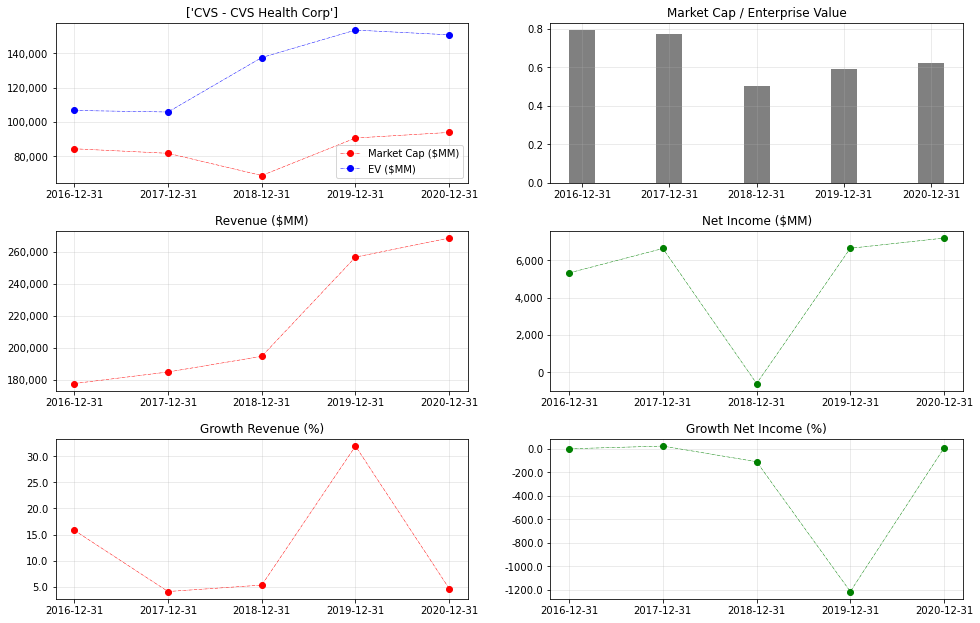

In [52]:
# PLOT 1

fig,ax =plt.subplots(figsize=(14,8),nrows=3,ncols=2)
fig.subplots_adjust(hspace=0.3,left=0.05, right=0.95, bottom=0.05, top=1.05)

ax[0][0].title.set_text(ticker + ' - ' + profile.companyName.values)
ax[0][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax[0][0].grid('True',alpha=0.3)
ax[0][0].plot(key_metrics.marketCap/1e6,c='r',ls="-.", lw=0.5,marker='o')
ax[0][0].plot(key_metrics.enterpriseValue/1e6,c='b',ls="-.", lw=0.5,marker='o')
ax[0][0].legend(['Market Cap ($MM)','EV ($MM)'],loc='lower right')

ax[0][1].title.set_text('Market Cap / Enterprise Value')
ax[0][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[0][1].grid('True',alpha=0.3)
ax[0][1].bar(key_metrics.index,key_metrics.marketCap/key_metrics.enterpriseValue,width=0.3,color='gray')

ax[1][0].title.set_text('Revenue ($MM)')
ax[1][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax[1][0].grid('True',alpha=0.3)
ax[1][0].plot(income_state.revenue/1e6,c='r',ls="-.", lw=0.5,marker='o')

ax[1][1].title.set_text('Net Income ($MM)')
ax[1][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax[1][1].grid('True',alpha=0.3)
ax[1][1].plot(income_state.netIncome/1e6,c='g',ls="-.", lw=0.5,marker='o')

ax[2][0].title.set_text('Growth Revenue (%)')
ax[2][0].grid('True',alpha=0.3)
ax[2][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[2][0].plot(income_growth.growthRevenue*100,c='r',ls="-.", lw=0.5,marker='o')

ax[2][1].title.set_text('Growth Net Income (%)')
ax[2][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[2][1].grid('True',alpha=0.3)
ax[2][1].plot(income_growth.growthNetIncome*100,c='g',ls="-.", lw=0.5,marker='o')

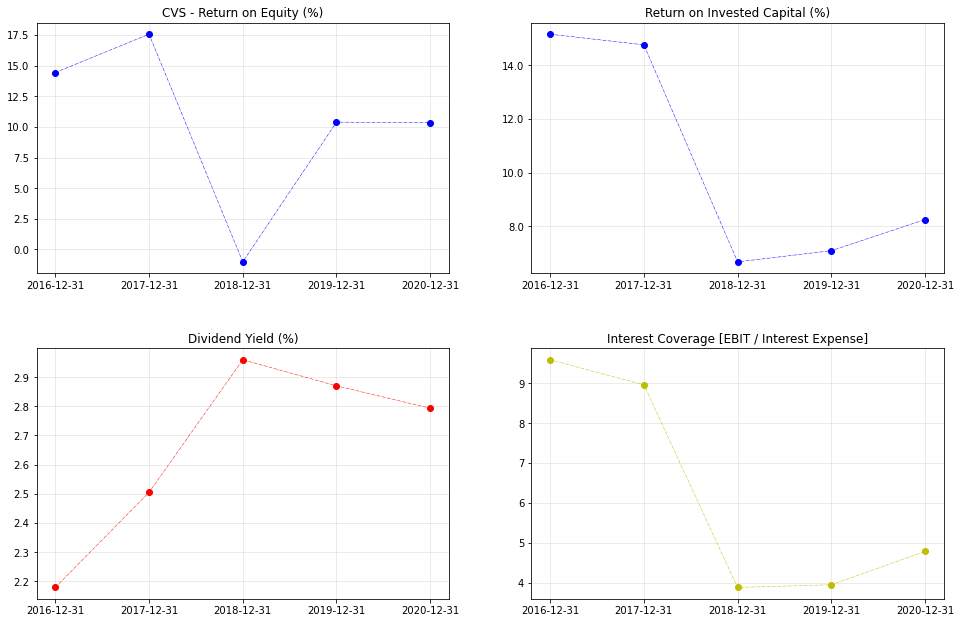

In [53]:
# PLOT 2

fig,ax =plt.subplots(figsize=(14,8),nrows=2,ncols=2)
fig.subplots_adjust(hspace=0.3,left=0.05, right=0.95, bottom=0.05, top=1.05)

ax[0][0].title.set_text(ticker + ' - Return on Equity (%)')
ax[0][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[0][0].grid('True',alpha=0.3)
ax[0][0].plot(key_metrics.roe*100,c='b',ls="-.", lw=0.5,marker='o')

ax[0][1].title.set_text('Return on Invested Capital (%)')
ax[0][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[0][1].grid('True',alpha=0.3)
ax[0][1].plot(key_metrics.roic*100,c='b',ls="-.", lw=0.5,marker='o')

ax[1][0].title.set_text('Dividend Yield (%)')
ax[1][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[1][0].grid('True',alpha=0.3)
ax[1][0].plot(key_metrics.dividendYield*100,c='r',ls="-.", lw=0.5,marker='o')

ax[1][1].title.set_text('Interest Coverage [EBIT / Interest Expense]')
ax[1][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.0f' % x))
ax[1][1].grid('True',alpha=0.3)
ax[1][1].plot(key_metrics.interestCoverage,c='y',ls="-.", lw=0.5,marker='o')

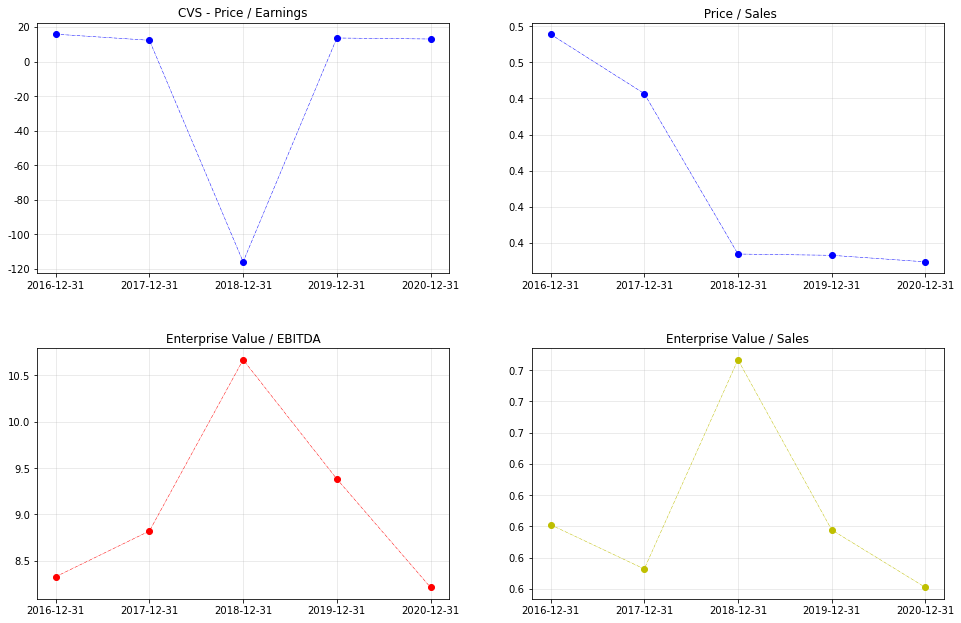

In [54]:
# PLOT 3

fig,ax =plt.subplots(figsize=(14,8),nrows=2,ncols=2)
fig.subplots_adjust(hspace=0.3,left=0.05, right=0.95, bottom=0.05, top=1.05)

ax[0][0].title.set_text(ticker + ' - Price / Earnings')
ax[0][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.0f' % x))
ax[0][0].grid('True',alpha=0.3)
ax[0][0].plot(key_metrics.peRatio,c='b',ls="-.", lw=0.5,marker='o')

ax[0][1].title.set_text(' Price / Sales')
ax[0][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[0][1].grid('True',alpha=0.3)
ax[0][1].plot(key_metrics.priceToSalesRatio,c='b',ls="-.", lw=0.5,marker='o')

ax[1][0].title.set_text('Enterprise Value / EBITDA')
ax[1][0].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[1][0].grid('True',alpha=0.3)
ax[1][0].plot(key_metrics.enterpriseValueOverEBITDA,c='r',ls="-.", lw=0.5,marker='o')

ax[1][1].title.set_text('Enterprise Value / Sales')
ax[1][1].get_yaxis().set_major_formatter(mpl.ticker.FuncFormatter(lambda x, pos: '%.1f' % x))
ax[1][1].grid('True',alpha=0.3)
ax[1][1].plot(key_metrics.evToSales,c='y',ls="-.", lw=0.5,marker='o')

In [55]:
actual_dy=2.8
actual_pe=18
# Historical (reference) - GMO & RA
# PE historico=20
# Earnings Growth historico =7

In [56]:
pe=list(range(10,55,5))
ge=list(range(1,11,1))
rdm = list()
for j in range(len(ge)):
    for i in range(len(pe)):
        valores=actual_dy + ge[j] + ((pe[i]/actual_pe)**0.14-1)*100
        rdm.append(valores)
matriz=np.array(rdm).reshape(len(ge),len(pe))
df=pd.DataFrame(matriz)
df.columns=pe
df.index=ge

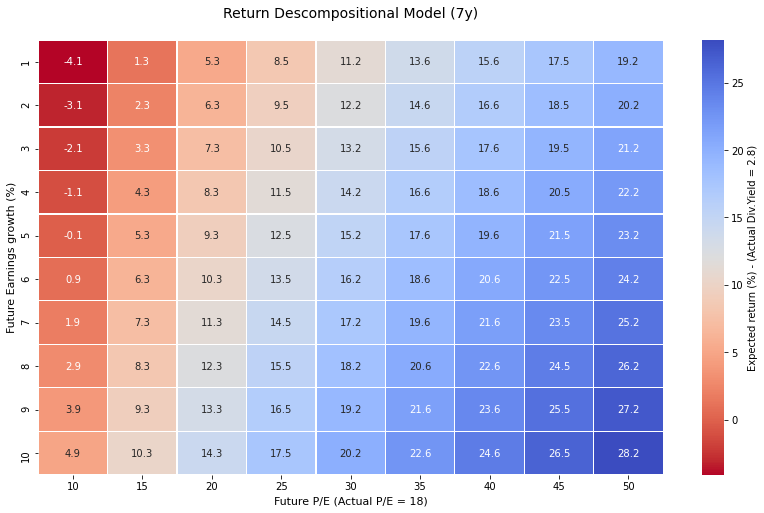

In [57]:
f,ax=plt.subplots(figsize=(14,8))
sns.heatmap(df,annot=True,fmt='.1f',linewidths=.3,cmap='coolwarm_r',ax=ax,cbar_kws={'label': 'Expected return (%)' + ' - (Actual Div.Yield = ' + str(actual_dy) +')'}) 
plt.title('Return Descompositional Model (7y)\n',fontsize = 14) 
plt.xlabel('Future P/E'+ ' (Actual P/E = ' + str(actual_pe) + ')', fontsize = 11) 
plt.ylabel('Future Earnings growth (%)', fontsize = 11)
plt.show()

****
****
# ANEXO
****
****

****
## STOCKS COMPARISON

<img src='images_3/compara_0.jpg' width='300'>

<img src='images_3/compara_1.jpg' width='400'>

<img src='images_3/compara_2.jpg' width='500'>

****
## NOTEBOOKS

Python_Traders_4/clases/estadistica

Python_Traders_1/curso_0_clase_11_tp_final_leo_sliwinsky

Python_Traders_4/tp_ml_MVP_0

****
## FINANCIAL APIs


https://codingandfun.com/best-sources-of-financial-data-to-use-with-python/


1. SEC – Free
2. Financialmodelingprep – Fremium
3. AlphaVantage – Freemium
4. Yahoo Finance – Free
5. Finviz – Free
6. DBNomics – Free (https://db.nomics.world/)
7. TradingView – Freemium



****
## SCREENING

https://www.ezstockscreener.com/ (indicadores tecnicos)

https://finviz.com/screener.ashx (version paga para exportar lista)

https://codingandfun.com/company-screener-python-finviz/

https://app.koyfin.com/home (limitado)

https://fmpcloud.io/api/v3/stock-screener

In [865]:
#https://financialmodelingprep.com/api/v3/stock-screener?marketCapMoreThan=1000000000&betaMoreThan=1&volumeMoreThan=10000&sector=Technology&exchange=NASDAQ&dividendMoreThan=0&limit=100&#apikey=bb2325e9fc32528d8472b3d75d1bd41c

def screenStock(minMktCap= 10**10,minBeta=1,minVol=10000,minDiv=0):
    
    url='https://financialmodelingprep.com/api/v3/stock-screener/'
    
    api_key='bb2325e9fc32528d8472b3d75d1bd41c'
    p = {'apikey': api_key, 'marketCapMoreThan':minMktCap ,'betaMoreThan':minBeta, 'volumeMoreThan':minVol, 'dividendMoreThan':minDiv}
    r = requests.get(url, params = p)
    js = r.json()
    df = pd.DataFrame(js)
    return df

****
## QUANSTATS

[*********************100%***********************]  1 of 1 completed
-0.8180145130121851
          start      valley         end  days  max drawdown  99% max drawdown
0    2000-01-04  2000-01-12  2000-01-20    16    -22.110538        -17.141278
1    2000-01-21  2000-02-02  2000-02-07    17    -12.940615        -11.674058
2    2000-02-09  2000-02-11  2000-02-14     5     -5.331932         -1.958705
3    2000-02-16  2000-02-25  2000-03-01    14     -7.247872         -6.512536
4    2000-03-02  2000-03-14  2000-03-21    19    -12.326082        -10.791330
..          ...         ...         ...   ...           ...               ...
175  2020-08-25  2020-08-25  2020-08-26     1     -0.820371          0.000000
176  2020-08-27  2020-08-28  2020-08-31     4     -1.355487         -1.195435
177  2020-09-02  2020-09-18  2020-12-28   117    -20.375615        -20.166931
178  2020-12-29  2021-01-06  2021-01-21    23     -7.381671         -6.986618
179  2021-01-27  2021-03-08  2021-04-07    70    -18.

                    Strategy
------------------  ----------
Start Period        2000-01-04
End Period          2021-04-07
Risk-Free Rate      0.0%
Time in Market      100.0%

Cumulative Return   14,677.86%
CAGR%               26.47%
Sharpe              0.79
Sortino             1.13
Max Drawdown        -81.8%
Longest DD Days     1770

Payoff Ratio        1.05
Profit Factor       1.16
Common Sense Ratio  1.25
CPC Index           0.64
Tail Ratio          1.07
Outlier Win Ratio   4.01
Outlier Loss Ratio  3.84

MTD                 4.15%
3M                  -1.55%
6M                  9.55%
YTD                 -3.98%
1Y                  95.38%
3Y (ann.)           46.37%
5Y (ann.)           37.56%
10Y (ann.)          28.43%
All-time (ann.)     26.47%

Avg. Drawdown       -5.37%
Avg. Drawdown Days  40
Recovery Factor     179.43
Ulcer Index         1.01


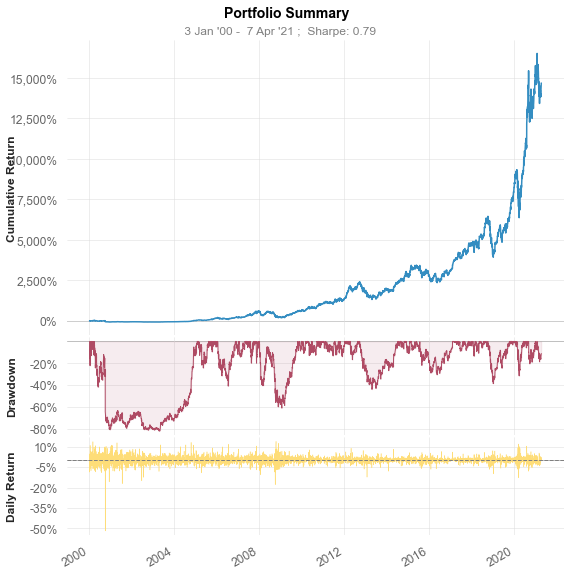

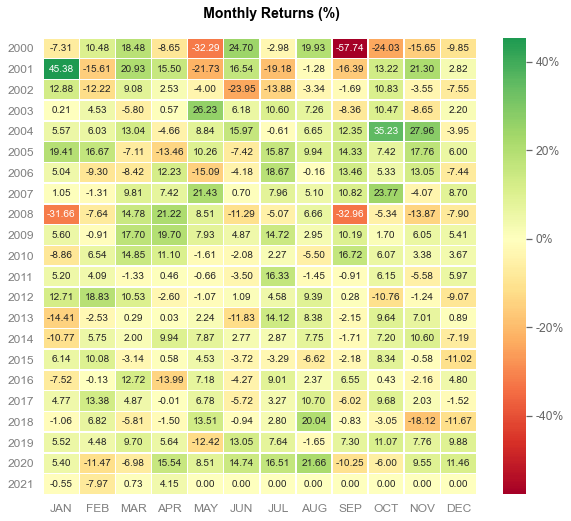

In [31]:
import yfinance as yf
import quantstats as qs

data = yf.download('AAPL', start='2000-01-01')['Adj Close']

print(qs.stats.max_drawdown(data))

dd=qs.stats.to_drawdown_series(data)
print(qs.stats.drawdown_details(dd))

aapl_ret=data.pct_change().dropna()
qs.reports.basic(aapl_ret)

****
## FUNDAMENTAL

https://financialmodelingprep.com/developer/docs/

https://financialmodelingprep.com/developer/docs/resources/

https://financialmodelingprep.com/developer/docs/formula

https://github.com/antoinevulcain/Financial-Modeling-Prep-API # Explicacion de todas las llamadas a las API

https://github.com/JerBouma/FundamentalAnalysis # Aplicacion del API de FMP

https://github.com/ikbale/fmp_python  # Python module to get stock data from the Financial Modeling Prep API


https://financialmodelingprep.com/education/other/yahoo-finance-api-alternatives # RESUMEN de APIS de MARKET

http://pages.stern.nyu.edu/~adamodar/

http://www.econ.yale.edu/~shiller/data.htm

https://www.guggenheiminvestments.com/mutual-funds/resources/interactive-tools/asset-class-correlation-map

https://www.yardeni.com/

https://www.gmo.com/americas/research-library/gmo-7-year-asset-class-forecast-january-2021/

**Blue Chip** / (WF portfolio)

Blue-chip stocks are seen as less volatile investments than owning shares in companies without blue-chip status because blue chips have an institutional status in the economy. The stocks are highly liquid since they are frequently traded in the market by individual and institutional investors alike. Therefore, investors who need cash on a whim can confidently create a sell order for their stock knowing that there will always be a buyer on the other end of the transaction.

Blue-chip companies are also characterized as having little to no debt, large market capitalization, stable debt-to-equity ratio, and high return on equity (ROE) and return on assets (ROA). The solid balance sheet fundamentals coupled with high liquidity have earned all blue-chip stocks the investment-grade bond ratings. While dividend payments are not absolutely necessary for a stock to be considered a blue chip, most blue chips have long records of paying stable or rising dividends.

An investor can track the performance of blue-chip stocks through a blue-chip index, which can also be used as an indicator of industry or economy performance. Most publicly traded blue-chip stocks are included in the Dow Jones Industrial Average (DJIA), one of the most popular blue-chip indices. Although changes made to the DJIA index are rare, an investor tracking blue chips should always monitor the DJIA to stay up to date with any changes made.

While a blue-chip company may have survived several challenges and market cycles, leading to it being perceived as a safe investment, this may not always be the case. The bankruptcies of General Motors and Lehman Brothers, as well as a number of leading European banks during the global recession of 2008, is proof that even the best companies may struggle during periods of extreme stress.

Stocks that are considered blue-chip stocks generally have these things in common:

    1) Large market capitalization. Market cap is a measure of the size and value of a company. Blue-chip stocks are often large-cap stocks, which typically means they have a market valuation of $10 billion or more.

    2) Growth history. Blue-chips have a reliable, solid history of sustained growth and good future prospects. They might not be flashy like fast-growing tech stocks, but that’s because they’re already established.

    3) Component of a market index. Blue-chip stocks are in major market indexes like the S&P 500, the Dow Jones Industrial Average and/or the Nasdaq 100.

    4) Dividends. Not all blue-chip stocks pay dividends, but many do. Dividends are regular payments made to investors from a company’s revenue. Companies that pay dividends are often mature, which means they may no longer need to invest as much revenue back into their growth


https://www.marketbeat.com/types-of-stock/blue-chip-stocks/

** Vaiables de Interest**

Five parameters to make an investment decision:

    1)Price to Earnings Ratio
    
    2)52 Week High/Low
    
    3)Interest Coverage Ratio
    
    4)Return on Equity
    
    5)Return on Capital Employed
    
    6)Price to Book Value


https://financialmodelingprep.com/education/financial-ratios/how-to-use-financial-ratios-to-pick-stocks

https://www.callan.com/ Tabla de Callan por rendimientos de Assets

Show the available companies
companies = fa.available_companies(api_key)

Collect general company information
profile = fa.profile(ticker, api_key)

Collect recent company quotes
quotes = fa.quote(ticker, api_key)

Collect market cap and enterprise value
#entreprise_value = fa.enterprise(ticker, api_key)

Show recommendations of Analysts
ratings = fa.rating(ticker, api_key)

Obtain DCFs over time
dcf_annually = fa.discounted_cash_flow(ticker, api_key, period="annual")
dcf_quarterly = fa.discounted_cash_flow(ticker, api_key, period="quarter")

Collect the Balance Sheet statements
balance_sheet_annually = fa.balance_sheet_statement(ticker, api_key, period="annual")
balance_sheet_quarterly = fa.balance_sheet_statement(ticker, api_key, period="quarter")

Collect the Income Statements
income_statement_annually = fa.income_statement(ticker, api_key, period="annual")
income_statement_quarterly = fa.income_statement(ticker, api_key, period="quarter")

Collect the Cash Flow Statements
cash_flow_statement_annually = fa.cash_flow_statement(ticker, api_key, period="annual")
cash_flow_statement_quarterly = fa.cash_flow_statement(ticker, api_key, period="quarter")

Show Key Metrics
key_metrics_annually = fa.key_metrics(ticker, api_key, period="annual")
key_metrics_quarterly = fa.key_metrics(ticker, api_key, period="quarter")

Show a large set of in-depth ratios
financial_ratios_annually = fa.financial_ratios(ticker, api_key, period="annual")
financial_ratios_quarterly = fa.financial_ratios(ticker, api_key, period="quarter")

Show the growth of the company
growth_annually = fa.financial_statement_growth(ticker, api_key, period="annual")
growth_quarterly = fa.financial_statement_growth(ticker, api_key, period="quarter")

Download general stock data
stock_data = fa.stock_data(ticker, period="ytd", interval="1d")

Download detailed stock data
stock_data_detailed = fa.stock_data_detailed(ticker, api_key, begin="2000-01-01", end="2020-01-01")

financialmodelingprep.com/api/v3/financial-growth/AAPL
  "symbol" : "AAPL",
  "growth" : [ {
    "date" : "2019-09-28",
    "Gross Profit Growth" : "-0.0338",
    "EBIT Growth" : "-0.0983",
    "Operating Income Growth" : "-0.0983",
    "Net Income Growth" : "-0.0718",
    "EPS Growth" : "-0.0033",
    "EPS Diluted Growth" : "-0.0017",
    "Weighted Average Shares Growth" : "-0.0681",
    "Weighted Average Shares Diluted Growth" : "-0.0702",
    "Dividends per Share Growth" : "0.1029",
    "Operating Cash Flow growth" : "-0.1039",
    "Free Cash Flow growth" : "-0.0815",
    "10Y Revenue Growth (per Share)" : "0.2343",
    "5Y Revenue Growth (per Share)" : "0.1341",
    "3Y Revenue Growth (per Share)" : "0.1265",
    "10Y Operating CF Growth (per Share)" : "0.2491",
    "5Y Operating CF Growth (per Share)" : "0.089",
    "3Y Operating CF Growth (per Share)" : "0.0747",
    "10Y Net Income Growth (per Share)" : "0.2469",
    "5Y Net Income Growth (per Share)" : "0.1301",
    "3Y Net Income Growth (per Share)" : "0.1274",
    "10Y Shareholders Equity Growth (per Share)" : "0.145",
    "5Y Shareholders Equity Growth (per Share)" : "0.0134",
    "3Y Shareholders Equity Growth (per Share)" : "-0.058",
    "10Y Dividend per Share Growth (per Share)" : "0.0",
    "5Y Dividend per Share Growth (per Share)" : "0.1062",
    "3Y Dividend per Share Growth (per Share)" : "0.1123",
    "Receivables growth" : "-0.0651",
    "Inventory Growth" : "0.0379",
    "Asset Growth" : "-0.0744",
    "Book Value per Share Growth" : "-0.0937",
    "Debt Growth" : "-0.0562",
    "R&D Expense Growth" : "0.1392",
    "SG&A Expenses Growth" : "0.0922"

financialmodelingprep.com/api/v3/income-statement/AAPL
  "symbol" : "AAPL",
  "financials" : [ {
    "date" : "2019-09-28",
    "Revenue" : "260174000000.0",
    "Revenue Growth" : "-0.0204",
    "Cost of Revenue" : "161782000000.0",
    "Gross Profit" : "98392000000.0",
    "R&D Expenses" : "16217000000.0",
    "SG&A Expense" : "18245000000.0",
    "Operating Expenses" : "34462000000.0",
    "Operating Income" : "63930000000.0",
    "Interest Expense" : "0.0",
    "Earnings before Tax" : "65737000000.0",
    "Income Tax Expense" : "10481000000.0",
    "Net Income - Non-Controlling int" : "0.0",
    "Net Income - Discontinued ops" : "0.0",
    "Net Income" : "55256000000.0",
    "Preferred Dividends" : "0.0",
    "Net Income Com" : "55256000000.0",
    "EPS" : "11.97",
    "EPS Diluted" : "11.89",
    "Weighted Average Shs Out" : "4519180000.0",
    "Weighted Average Shs Out (Dil)" : "4617834000.0",
    "Dividend per Share" : "3.0",
    "Gross Margin" : "0.3782",
    "EBITDA Margin" : "0.301",
    "EBIT Margin" : "0.2527",
    "Profit Margin" : "0.212",
    "Free Cash Flow margin" : "0.2264",
    "EBITDA" : "78284000000.0",
    "EBIT" : "65737000000.0",
    "Consolidated Income" : "55256000000.0",
    "Earnings Before Tax Margin" : "0.2527",
    "Net Profit Margin" : "0.2124"